# Final Project - Airbnb listings sentiment and price prediction

# Load Libraries

In [1]:
import ast
import os
import pickle
import warnings
from collections import Counter
from datetime import datetime
from itertools import chain

import dataframe_image as dfi
import fasttext
import geopandas as gpd

%matplotlib inline
import matplotlib.pyplot as plt
import nltk
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import spacy
import tensorflow as tf
from autocorrect import Speller
from ftlangdetect import detect
from imblearn.over_sampling import SMOTE
from IPython.display import display
from keras import regularizers
from nltk.probability import FreqDist
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from scipy import sparse, stats
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import (
    GradientBoostingRegressor,
    RandomForestRegressor,
    VotingClassifier,
)
from sklearn.exceptions import ConvergenceWarning
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.isotonic import IsotonicRegression
from sklearn.linear_model import (
    ARDRegression,
    BayesianRidge,
    ElasticNet,
    HuberRegressor,
    Lars,
    LassoCV,
    LinearRegression,
    LogisticRegression,
    OrthogonalMatchingPursuit,
    PassiveAggressiveRegressor,
    Ridge,
    SGDClassifier,
    SGDRegressor,
    TheilSenRegressor,
)
from sklearn.metrics import (
    ConfusionMatrixDisplay,
    PredictionErrorDisplay,
    accuracy_score,
    classification_report,
    f1_score,
    mean_absolute_error,
    mean_squared_error,
    precision_score,
    r2_score,
    recall_score,
)
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
from sklearn.naive_bayes import ComplementNB, MultinomialNB
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, RobustScaler
from sklearn.svm import SVR, LinearSVC, LinearSVR, NuSVR
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from tensorflow import keras
from tensorflow.keras import layers
from tqdm.auto import tqdm
from wordcloud import WordCloud
from xgboost import XGBClassifier, XGBRegressor

# Ignore convergence warnings
ConvergenceWarning("ignore")

# Download vader lexicon
nltk.download("vader_lexicon")

# Download space english model small
nlp = spacy.load("en_core_web_sm")

# Matplotlib settings
plt.style.use("seaborn-v0_8-dark")

# Ignore warnings
warnings.filterwarnings("ignore")

# Remove fasttext warning
fasttext.FastText.eprint = lambda x: None

# Set option to display columns
pd.set_option("display.max_columns", None)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/alexanderabramkov/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


# Build Functions

In [2]:
# Function to plot frequency distribution
def freq_desc(df):
    """Function to plot frequency distribution"""

    # Numeric dtypes list
    num_dtypes = ["int16", "int32", "int64", "float16", "float32", "float64"]

    # Quantile list for frequency distribution
    quantile = [0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.98]

    # Convert df from series to dataframe
    if isinstance(df, pd.Series):
        df = pd.DataFrame(df)

    # Number of rows depend on columns dtypes and length
    nrows = (
        len(df.columns)
        if df.dtypes[0].name in num_dtypes
        else len(df.columns) // 2 + len(df.columns) % 2
    )

    # Define plt.subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=[10, 4 * nrows])

    # Delete unused axe
    if df.dtypes[0].name not in num_dtypes and len(df.columns) % 2 != 0:
        if len(df.columns) > 1:
            fig.delaxes(axes[len(df.columns) // 2][len(df.columns) % 2])
        else:
            fig.delaxes(axes[1])

    # Iterate through df columns
    for i in range(0, len(df.columns)):

        # Titles for bar and kde plot
        title_bar = "Distribution of '" + df.columns[i] + "' , %"
        title_kde = "KDE of '" + df.columns[i] + "'"

        # If dtype is numeric
        if (df.dtypes[i].name) in num_dtypes:

            # Define the number of floating points and increments
            # depends on series standard deviation
            if df.iloc[:, [i]].squeeze().std() < 1:
                points = 2
                inc = 0.01
            elif (
                df.iloc[:, [i]].squeeze().std() >= 1
                and df.iloc[:, [i]].squeeze().std() < 10
            ):
                points = 1
                inc = 0.1
            else:
                points = 0
                inc = 1

            # Generate bins for quantiles
            bins = [df.iloc[:, [i]].squeeze().quantile(j) for j in quantile]

            # Insert the minimum at the bin start
            bins.insert(0, min(-inc, df.iloc[:, [i]].squeeze().min()))

            # Insert the maximum at the bin start
            bins[-1] = df.iloc[:, [i]].squeeze().max()

            # Remove duplicates
            bins = list(dict.fromkeys(bins))

            # Generate labels depends of floating points number
            if points == 0:
                labels = [
                    "{0:,} - {1:,}".format(round(bins[k - 1] + inc), round(bins[k]))
                    for k in range(1, len(bins))
                ]
            elif points == 1:
                labels = [
                    "{0:.1f} - {1:.1f}".format(
                        round(bins[k - 1] + inc, 1), round(bins[k], 1)
                    )
                    for k in range(1, len(bins))
                ]
            else:
                labels = [
                    "{0:.2f} - {1:.2f}".format(
                        round(bins[k - 1] + inc, 2), round(bins[k], 2)
                    )
                    for k in range(1, len(bins))
                ]

            # Calculate frequency distribution
            freq = (
                pd.cut(
                    df.iloc[:, [i]].squeeze(),
                    bins=bins,
                    labels=labels,
                    ordered=True,
                )
                .value_counts(normalize=True, dropna=False)
                .multiply(100)
                .sort_index()
            )

            # x-axis labels rotation
            rot = 0 if len(max(labels, key=len)) < 6 else 90

            # Plot bar
            bar_plot(freq, title_bar, axes[i, 0] if nrows > 1 else axes[0], rot)

            # Plot KDE
            kde_plot(
                df.iloc[:, [i]], title_kde, axes[i, 1] if nrows > 1 else axes[1], bins
            )

        # If dtype is not numeric
        else:
            # Calculate frequency distribution
            freq = (
                df.iloc[:, [i]]
                .squeeze()
                .value_counts(normalize=True, dropna=False)
                .multiply(100)
                .sort_index()
            )

            # x-axis labels rotation
            rot = 0 if freq.index.astype(str).str.len().max() < 6 else 90

            # Plot bar
            if len(df.columns) > 2:
                bar_plot(freq, title_bar, axes[i // 2, i % 2], rot)
            else:
                bar_plot(freq, title_bar, axes[i], rot)

    # Save figure to the disk
    plt.tight_layout()
    save_figure(fig, df.columns[0] + "_freq_desc")

    # Plot the figure
    plt.show()

In [3]:
# Function to plot kde with rug
def kde_rug_plot(df, title):
    """Function to plot kde with rug"""

    # Numeric dtypes list
    num_dtypes = ["int16", "int32", "int64", "float16", "float32", "float64"]

    # Create df for numeric columns
    df_numeric = pd.DataFrame()

    # Copy numeric columns from df to df_numeric
    for column in df:
        if df[column].dtype.name in num_dtypes:
            df_numeric[column] = df[column]

    # Number of rows depend on df_numeric length
    nrows = len(df_numeric.columns) // 2 + len(df_numeric.columns) % 2

    # Define plt.subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=[10, 4 * nrows])

    # Delete unused axe
    if len(df_numeric.columns) % 2 != 0:
        if len(df_numeric.columns) > 1:
            fig.delaxes(axes[len(df_numeric.columns) // 2][len(df_numeric.columns) % 2])
        else:
            fig.delaxes(axes[1])

    # Iterate through df_numeric columns
    for i in range(0, len(df_numeric.columns)):

        # Define ax
        ax = axes[i // 2, i % 2] if nrows > 2 else axes[i]

        # Plot KDE
        sns.kdeplot(data=df_numeric, x=df_numeric.columns[i], ax=ax)

        # Plot rug
        sns.rugplot(data=df_numeric, x=df_numeric.columns[i], ax=ax)

    # Set title
    plt.title(title)

    # Save figure to the disk
    plt.tight_layout()
    save_figure(fig, title)

    # Plot the figure
    plt.show()

In [4]:
# Function to plot bar chart
def bar_plot(df, title, ax, rot):
    """Function to plot bar chart

    Inputs are: dataframe, title, ax and x-axe labels rotation
    """
    df.plot(
        kind="bar",
        grid=None,
        color=sns.color_palette("YlOrRd", len(df)),
        ax=ax,
        rot=rot,
        title=title,
        xlabel="",
        ylabel="%",
    ).grid(axis="y")

In [5]:
# Function to plot kde chart
def kde_plot(df, title, ax, ind):
    """Function to plot kde chart

    Inputs are: dataframe, title, ax and ind
    """
    df.plot.kde(
        ax=ax,
        title=title,
        legend=False,
        ind=ind,
    )

In [6]:
# Function to plot correlation matrix
def find_corr(data, title):
    """Function to plot correlation matrix

    Inputs are: dataframe and title
    """

    # Calculate correlation matrix
    corr_matrix = data.corr().round(2)

    # Define a mask to show the half of a matrix
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    # Plot the figure
    fig, ax = plt.subplots(figsize=[6, 5])
    sns.heatmap(
        corr_matrix, annot=True, vmax=1, vmin=-1, center=0, cmap="vlag", mask=mask
    ).set(title=title)
    plt.tight_layout()

    # Save figures to the disk
    save_figure(fig, title)

    plt.show()

In [7]:
# Function to convert data to numeric
def convert_to_numeric(data):
    """Function to convert data to numeric"""

    num_dtypes = ["int16", "int32", "int64", "float16", "float32", "float64"]
    return (
        pd.to_numeric(
            data.replace(to_replace=["\$", "\%", ","], value="", regex=True),
            downcast="integer",
        )
        if data.dtypes.name not in num_dtypes
        else data
    )

In [8]:
# Function to calculate the number of days till today
def days_till_now(data):
    """Function to calculate the number of days till today"""

    return (pd.to_datetime("today") - data).dt.days

In [9]:
# Function to convert data to datetime
def convert_to_datetime(data):
    """Function to convert data to datetime"""

    return (
        pd.to_datetime(data, format="mixed")
        if data.dtypes.name != "datetime64[ns]"
        else data
    )

In [10]:
# Function to convert data to integer
def convert_to_int(data):
    """Function to convert data to integer"""

    return data.astype(int) if data.dtypes.name != "int64" else data

In [11]:
# Function to convert data to bool
def convert_to_bool(data):
    """Function to convert data to bool"""

    return ~data.isnull() if data.dtypes.name != "bool" else data

In [12]:
# Function to merge dataframes
def df_merge(df1, df2, left_on, right_on):
    """Function to merge two dataframes

    Inputs are: df1, df2, left_on, right_on
    """

    if df2.columns[1] in df1.columns:
        df1.drop(df2.columns[1], axis=1, inplace=True)
    return df1.merge(
        df2,
        how="left",
        left_on=left_on,
        right_on=right_on,
    )

In [13]:
# Function to save plt figure as to png and pkl files
def save_figure(fig, name, tight=True):
    """Function to save plt figure"""

    if tight:
        fig.set_tight_layout(True)
    fig.savefig(os.path.join(path_png, name + ".png"), format="png")
    pickle.dump(fig, open(os.path.join(path_pkl, name), "wb"))

In [14]:
# Function to load figure from pkl file
def load_figure(name):
    """Function to load from pickle file"""
    return pickle.load(open(os.path.join(path_pkl, name), "rb"))

In [15]:
# Function to load model from pkl file
def load_model(name):
    """Function to load from pickle file"""
    return pickle.load(open(os.path.join(path_models, name), "rb"))

In [16]:
# Function to detect language
def detect_language(data, title):
    """Function to detect language"""

    # Copy series
    ser = data.copy()

    # Detect language
    tqdm.pandas(desc="Detect language", colour="green", position=0, leave=True)
    languages = ser.progress_apply(
        lambda x: str(detect(text=x, low_memory=False)["lang"])
    )

    # Assign empty string to non-english
    ser.iloc[languages[languages != "en"].index] = ""

    # Calculate language frequency
    lan_freq = languages.value_counts(normalize=True).nlargest(10) * 100
    lan_freq = pd.DataFrame({"lan": lan_freq.keys(), "freq": lan_freq.values})
    lan_freq["freq"] = lan_freq["freq"].apply(float)
    lan_freq["norm"] = (lan_freq.freq - lan_freq.freq.min() + 1) / (
        lan_freq.freq.max() - lan_freq.freq.min() + 1
    )

    # Draw chart for language frequency
    fig, ax = plt.subplots(figsize=(11, 5))
    lan_freq.plot.scatter(
        x="lan",
        y="freq",
        s=lan_freq.norm * 1000,
        c="freq",
        colormap="viridis",
        ylim=(-5, 109),
        title=title,
        ax=ax,
    )
    ax.set_xlabel("")
    ax.set_ylabel("")
    ylabels = ["{0:.0f}%".format(x) for x in ax.get_yticks()]
    ax.set_yticklabels(ylabels)
    plt.tight_layout()

    # Save figure
    save_figure(fig, title)

    plt.show()

    return ser

In [17]:
# Function for spell correction
def spell_correction(data):
    """Function for spell correction"""

    # Copy series
    ser_spell = data.copy()

    # Correct the spelling of the words
    spell = Speller(fast=True)
    tqdm.pandas(desc="Spell correction", colour="green", position=0, leave=True)
    return ser_spell.progress_apply(lambda x: spell(x))

In [18]:
# Function for text cleaning
def text_cleaning(data):
    """Function for text cleaning"""

    # Define pipe parameters
    n_process = 6
    batch_size = 500

    # Pipe the comments and add spell checking to the pipe
    docs = nlp.pipe(data, n_process=n_process, batch_size=batch_size)

    # Init empty list for cleaned tokens
    clean_list = []

    # Iterate in pipe
    for doc in tqdm(docs, total=len(data), desc="Text preprocessing", colour="green"):
        tokens = [
            token.lemma_.strip().lower()
            for token in doc
            if not token.is_stop and token.is_alpha and token.pos_ != "PROPN"
        ]

        clean_list.append(tokens)

    # Init empty list for cleaned sentences
    clean_sent = []

    # Construct cleaned sentences
    for desc in clean_list:
        sent = " ".join(word for word in desc)
        clean_sent.append(sent)

    return clean_list, clean_sent

In [19]:
# Function to calculate Vader sentiment score
def getSentimentScoreVader(text):
    """Function to calculate Vader sentiment score.
    Input is text. Output is compound sentiment score.
    """

    # Initialize Vader sentiment intensity analyzer
    sid = SentimentIntensityAnalyzer()

    return round(sid.polarity_scores(text)["compound"], 2)

In [20]:
# Function to calculate words frequency and draw charts
def word_freq(ls, title):
    """Function to calculate words frequency and draw charts"""

    # Define words limit
    words_limit = 20

    # Calculate frequency distribution of words in comments
    word_dist = FreqDist(ls)
    df_word_dist = pd.DataFrame(
        word_dist.most_common(words_limit), columns=["word", "count"]
    )

    # Draw word frequency chart
    fig, ax = plt.subplots(figsize=(10, 5))
    df_word_dist.plot.bar(
        x="word",
        y="count",
        color=sns.color_palette("Spectral", n_colors=words_limit),
        title=title,
        legend=None,
        xlabel="",
        ylabel="",
        ax=ax,
    ).grid(axis="y")
    ylabels = ["{0:.0f}K".format(x / 1000) for x in ax.get_yticks()]
    ax.set_yticklabels(ylabels)
    plt.tight_layout()

    # Save figure
    save_figure(fig, title)

    plt.show()

In [21]:
# Function to draw word cloud
def word_cloud(ls, title):
    """Function to draw word cloud"""

    # Calculate frequency distribution
    word_dist = FreqDist(ls)

    # Generate the cloud using a frequency dictionary
    wc_generator = WordCloud(
        width=900,
        height=450,
        min_font_size=14,
        background_color="#333333",
        colormap="spring",
    ).generate_from_frequencies(word_dist)

    # Draw figure
    fig = plt.figure(figsize=(13, 6))
    plt.imshow(wc_generator, interpolation="bilinear")
    plt.axis("off")
    fig.suptitle(title, fontsize=20)
    plt.tight_layout()

    # Save figure
    save_figure(fig, title)

    plt.show()

In [22]:
# Function to aggregate list amentities
def elements_agg(ls, dict):
    """Function to aggregate list amentities"""

    # Aggregate list
    ls_agg = []

    # Iterate through ls and dict elements
    for element in ls:
        size = len(ls_agg)
        for key, value in {**dict}.items():
            for v in value:
                if v in element.lower():

                    # If dict.item is in ls, append dict.key to agg list
                    ls_agg.append(key)
                    break
        if len(ls_agg) == size:

            # If no elements in dict was found, append element
            ls_agg.append(element.lower())

    return ls_agg

In [23]:
# Function to plot distribution from counter
def counter_plot(counter, title):
    """Function to plot distribution from counter"""

    # Convert counter to dataframe
    df_counter = (
        pd.DataFrame.from_dict(counter, orient="index")
        .reset_index()
        .sort_values(by=0, ascending=False)
    )
    df_counter = df_counter.rename(columns={"index": "element", 0: "count"})

    # Draw frequency chart
    fig, ax = plt.subplots(figsize=(14, 5))
    df_counter.plot.bar(
        x="element",
        y="count",
        color=sns.color_palette("Spectral", n_colors=len(counter)),
        title=title,
        legend=None,
        xlabel="",
        ylabel="",
        ax=ax,
    ).grid(axis="y")
    ylabels = ["{0:.0f}K".format(x / 1000) for x in ax.get_yticks()]
    ax.set_yticklabels(ylabels)
    plt.tight_layout()

    # Save figure
    save_figure(fig, title)

    plt.show()

In [24]:
# Function to calculate Pearson coeff and p-value
def pearsonr(df_x, df_y):
    """Function to calculate Pearson coeff and p-value from dataframes"""

    # Create new df for Pearson coeffs and p-values
    df_pearson = pd.DataFrame(
        index=df_x.columns, columns=["Pearson coefficient", "p-value"], dtype=np.float64
    )

    # Convert df_y to NumPy
    y = df_y.to_numpy()

    # Calculate Pearson coeffs and p-values for columns in df_x
    for i in df_x.columns:
        x = df_x[i].to_numpy()
        pearson = stats.pearsonr(x, y)
        df_pearson.loc[i] = pd.Series(
            {"Pearson coefficient": pearson.statistic, "p-value": pearson.pvalue}
        )

    # Cut Pearson coefficient for "Negative" and "Positive" labels
    df_pearson["pearson-index"] = pd.cut(
        df_pearson["Pearson coefficient"],
        bins=[-1.0, 0, 1.0],
        labels=["Negative", "Positive"],
        include_lowest=True,
    )

    # Cut p-values for ""Strong", "Moderate", "Weak", "Insignificant" labels
    df_pearson["p-index"] = pd.cut(
        df_pearson["p-value"],
        bins=[0, 0.001, 0.05, 0.1, 1.0],
        labels=["Strong", "Moderate", "Weak", "Insignificant"],
        include_lowest=True,
    )

    # Copy df_pearson with index like column for filter applying
    df_pearson_weak = df_pearson.copy()
    df_pearson_weak["var"] = df_pearson.index

    # Return Pearson coeffs, p-values and list of columns which are "Weak" or "Insignificant"
    return (
        df_pearson,
        df_pearson_weak.loc[
            (
                (df_pearson_weak["p-index"] == "Weak")
                | (df_pearson_weak["p-index"] == "Insignificant")
            )
            & (~df_pearson_weak["var"].str.contains("neighbourhood"))
        ].drop("var", axis=1),
    )

In [25]:
# Function to find correlation with a given thereshold
def correlation(data, threshold):
    """Function to find correlation with a given thereshold"""

    # Create set for deleted columns
    col = set()
    corr_matrix = data.corr()

    # Print table headers
    print("  \n    Correlation with more than :", threshold)
    print("\n\nCorrelation", "\t", "Fearture 1", "\t\t\t\t", "Feature 2")

    # Print correlation greater than threshold
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (abs(corr_matrix.iloc[i, j]) >= threshold) and (
                corr_matrix.columns[j] not in col
            ):
                print(
                    f"{corr_matrix.iloc[i, j].round(2):<{16}} {corr_matrix.columns[i]:{39}} {corr_matrix.columns[j]:{40}}"
                )

In [26]:
# Helper function to print classification report and confusion matrix
def metrics(model):
    """Function to print classification report and confusion matrix"""

    # Predicted labels
    y_pred_sentiment_tfid = model.predict(X_test_sentiment_tfid)

    # Print classification report
    print("Classification Report:\n")
    print(
        classification_report(
            y_test_sentiment_tfid,
            y_pred_sentiment_tfid,
            target_names=label_encoder.classes_,
        )
    )

    # Display confusion matrix
    print("Confusion matrix:\n")
    fig, ax = plt.subplots()
    cmd = ConfusionMatrixDisplay.from_predictions(
        y_test_sentiment_tfid,
        y_pred_sentiment_tfid,
        normalize="true",
        display_labels=label_encoder.classes_,
        ax=ax,
    )
    ax.grid(False)
    save_figure(fig, type(model).__name__)
    plt.show()

    # Save evaluation metrics to dict
    model_name = str(model)
    model_comp[model_name[: model_name.index("(")]] = {
        "accuracy": accuracy_score(y_test_sentiment_tfid, y_pred_sentiment_tfid),
        "recall": recall_score(
            y_test_sentiment_tfid, y_pred_sentiment_tfid, average="macro"
        ),
        "precision": precision_score(
            y_test_sentiment_tfid, y_pred_sentiment_tfid, average="macro"
        ),
        "f1": f1_score(y_test_sentiment_tfid, y_pred_sentiment_tfid, average="macro"),
    }

    # Save model
    pickle.dump(model, open(os.path.join(path_models, type(model).__name__), "wb"))

In [27]:
# Function to convert df to vector
def to_vec(df):
    """Vectorize df
    Input: text. Output: vector representation.
    """
    return vectorize_layer(tf.convert_to_tensor(df))

In [28]:
# Return original text for TfidfVectorizer
def identity(text):
    """function return original token"""
    return text

In [29]:
def iqr(df):
    """Interquartile range detection
    Input: df with outliers, return: indexes of outliers
    """

    # Calculate the upper and lower limits
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr

    # Create arrays of Boolean values indicating the outlier rows
    upper_idx = np.where(df >= upper)[0]
    lower_idx = np.where(df <= lower)[0]

    # print info
    print("IQR is: ", iqr)
    print("Lower limit", lower)
    print("Upper limit", upper)

    # return indexes of outliers
    return np.concatenate((lower_idx, upper_idx), axis=None)

In [30]:
# Evaluation metrics for price prediction
def metrics_price(model, dict, type="ml"):
    """Evaluation metrics for price prediction"""

    # Predicted prices
    y_pred_price = model.predict(X_test_listings)

    model_comp_dict = dict.copy()

    if type == "dl":
        y_pred_price = y_pred_price.flatten()

    # Calculate valuation metrics
    mae = round(mean_absolute_error(y_test_listings, y_pred_price), 2)
    mse = round(mean_squared_error(y_test_listings, y_pred_price), 2)
    r2 = round(r2_score(y_test_listings, y_pred_price), 2)

    # Save evaluation metrics to dict
    if type == "ml":
        model_name = str(model)
        model_comp_dict[model_name[: model_name.index("(")]] = {
            "MAE": mae,
            "MSE": mse,
            "R2": r2,
            "y_pred": y_pred_price,
        }

        # Save model
        pickle.dump(
            model,
            open(os.path.join(path_models, model_name[: model_name.index("(")]), "wb"),
        )

    elif type == "dl":
        model_comp_dict[model.name] = {
            "MAE": mae,
            "MSE": mse,
            "R2": r2,
            "y_pred": y_pred_price,
        }

        # Save the model
        model.save(os.path.join(path_models, model.name + ".h5"))

    else:
        model_comp_dict[type] = {
            "MAE": mae,
            "MSE": mse,
            "R2": r2,
            "y_pred": y_pred_price,
        }

        # Save model
        pickle.dump(
            model,
            open(os.path.join(path_models, "fine_tuned_model"), "wb"),
        )

    return model_comp_dict

In [31]:
# Function to draw diagram with price prediction models evaluation
def models_eval_chart(dict, y_true):
    """Draw chart with price prediction models evaluation"""

    fig, axs = plt.subplots(
        round(len(dict) / 2),
        2,
        figsize=(8, 4 * (round(len(dict) / 2) - 1)),
    )
    axs = np.ravel(axs)
    for i, ax in enumerate(axs):
        display = PredictionErrorDisplay.from_predictions(
            y_true=y_true,
            y_pred=pd.Series(list(dict.values())[i].get("y_pred")),
            kind="actual_vs_predicted",
            ax=ax,
            scatter_kwargs={"alpha": 0.2, "color": "tab:blue"},
            line_kwargs={"color": "tab:red"},
        )
        ax.set_title(f"{list(dict.keys())[i]} algorithm")
        reg_metrics = {
            "MAE": list(dict.values())[i]["MAE"],
            "MSE": list(dict.values())[i]["MSE"],
            "R2": list(dict.values())[i]["R2"],
        }
        label = [
            "{0}: {1:.2f}".format(name, score) for name, score in reg_metrics.items()
        ]
        label = "\n".join(label)
        ax.plot([], [], " ", label=label)
        ax.legend(loc="upper left")
    title = "Comparision of predictions with different algorithms"
    plt.suptitle(title, fontsize=16, fontweight="bold", y=1.005)
    # plt.tight_layout()
    plt.subplots_adjust(bottom=0.8)

    # Save figure
    save_figure(fig, title)

    plt.show()

In [32]:
# Listings amentities dictionary
amentities_dict = {
    "air": ["air", "ac unit", "ac - split", "fan"],
    "av": ["sound", "speaker", "tv", "record player"],
    "baby": ["baby", "crib", "children", "toys"],
    "bar": ["bar"],
    "bed linens": ["essentials", "pillows"],
    "cleaning": ["cleaning", "housekeeping"],
    "clothing care": [
        "iron",
        "washer",
        "laundromat",
        "drying rack for clothing",
        "clothes steamer",
    ],
    "clothing storage": ["clothing storage"],
    "cooking basics": ["dishes", "glasses", "baking"],
    "entertainment": [
        "bowling alley",
        "movie theater",
        "theme room",
        "atting cage",
        "laser tag",
        "books",
    ],
    "ev charger": ["ev charger"],
    "fireplace": ["fireplace"],
    "furniture": ["chair", "table"],
    "game console": ["console", "keypad"],
    "games": ["life size games", "board games", "arcade games"],
    "garden": ["hammock", "loungers", "outdoor", "backyard"],
    "hair dryer": ["dryer"],
    "heating": ["heating"],
    "hot tub": ["tub"],
    "kitchen": ["kitchen"],
    "large household appliances": [
        "oven",
        "refrigerator",
        "fridge",
        "grill",
        "stove",
        "microwave",
        "freezer",
        "ice",
    ],
    "maintenance": ["property manager", "concierge", "building staff"],
    "marking": ["parking", "garage", "carport"],
    "patio": ["patio"],
    "pool": ["pool"],
    "resort": ["beach", "lake", "resort", "waterfront", "ski"],
    "restaurant": ["restaurant"],
    "sauna": ["sauna"],
    "safe": ["safe", "lockbox"],
    "security systems": [
        "security",
        "alarm",
        "fire",
        "guards",
        "outlet covers",
        "lock",
    ],
    "smoking": ["smoking"],
    "small household appliances": [
        "coffee",
        "hot water",
        "toaster",
        "trash",
        "bread",
        "blender",
    ],
    "sport": [
        "exercise",
        "fitness",
        "gym",
        "hockey rink",
        "bikes",
        "kayak",
        "boat slip",
        "golf",
        "climbing wall",
        "skate",
    ],
    "toiletries": [
        "shampoo",
        "soap",
        "gel",
        "toiletries",
        "slippers",
        "conditioner",
        "air",
    ],
    "view": ["view"],
    "wifi": ["wifi", "ethernet"],
}

# Data Acquisition

> We will utilize the public dataset accessible at http://insideairbnb.com/get-the-data to retrieve the data from Airbnb for New York City, US, from 1 November 2022 to 1 November 2023.

In [36]:
# Assign path for working directory with datasets
path = "/Users/alexanderabramkov/Downloads/data for airbnb"

# Assign path for directory with charts png files
path_png = os.path.join(path, "png")

# Assign path for directory with charts pkl files
path_pkl = os.path.join(path, "pkl")

# Assign path for directory with df dumps
path_df = os.path.join(path, "df")

# Assign path for directory with models dumps
path_models = os.path.join(path, "models")

# Create directories for dump files if it doesn't exist
if not os.path.exists(path_png):
    os.makedirs(path_png)
if not os.path.exists(path_pkl):
    os.makedirs(path_pkl)
if not os.path.exists(path_df):
    os.makedirs(path_df)
if not os.path.exists(path_models):
    os.makedirs(path_models)

# Read Airbnb datasets
df_reviews_raw = pd.read_csv(os.path.join(path, "reviews.csv"))
df_listings_raw = pd.read_csv(os.path.join(path, "listings.csv"))

# Print datasets info
print("Reviews dataframe info:")
print(df_reviews_raw.info())
print("Listings dataframe info: ")
print(df_listings_raw.info())

Reviews dataframe info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1001885 entries, 0 to 1001884
Data columns (total 6 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   listing_id     1001885 non-null  int64 
 1   id             1001885 non-null  int64 
 2   date           1001885 non-null  object
 3   reviewer_id    1001885 non-null  int64 
 4   reviewer_name  1001882 non-null  object
 5   comments       1001624 non-null  object
dtypes: int64(3), object(3)
memory usage: 45.9+ MB
None
Listings dataframe info: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39160 entries, 0 to 39159
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            39160 non-null  int64  
 1   listing_url                                   39160 non-null  object 
 2   scrape_i

# Data Preprocessing and Explanatory Analysis

## Reviews Dataframe

### Dataframe Description

> The reviews.csv contains the following columns:
 
>- listing_id - the id of listing,
>- id - the id of review,
>- date - the review date,
>- reviewer_id - the reviewer id,
>- reviewer_name - the reviewer name,
>- comments - the review.

### Data Cleaning, Preprocessing and Explanatory Analysis

#### Drop Columns with Redundant Information

> Columns with redundand information for sentiment analysis will be dropped.

In [37]:
# Copy dataframe to work with
df_reviews = df_reviews_raw.copy()

# Drop columns with redundant information for sentiment analysis
columns_to_drop = [
    "id",
    "date",
    "reviewer_id",
    "reviewer_name",
]
df_reviews.drop(columns_to_drop, axis=1, inplace=True, errors="ignore")

#### Text cleaning and Explanatory Analysis

> Next, we will set the correct data type to columns, remove unnecessary columns, detect comments language and correct the spelling. After detection we will drop non-English comments.

> For language detection we will use the 'fasttext-langdetect' library. This library is a wrapper for the language detection model trained on fasttext by Facebook. This library is the fastest and have high accuracy.

> For spell correction we will use the 'autocorrect' library.

> The next step is to preprocess the text. In this step, we will handle the comments in the following way:

>- Tokenization is the process of separating the text into a list of tokens.
>- Lowercasing or changing all the text to lowercase letters.
>- The removal of digits, punctuation, links, and proper nouns.
>- The process of lemmatization, which involves the reduction of words to their basic form based on their component of speech.
>- Remove the stop words.

> We will utilize the SpaCy library and pipe instrument, which facilitate parallel processing to enhance performance.

Detect language:   0%|          | 0/1001885 [00:00<?, ?it/s]

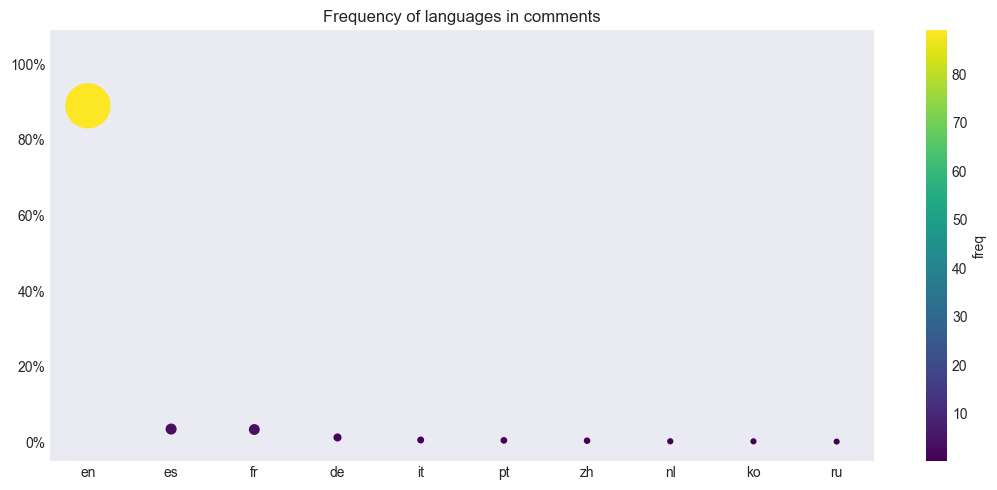

Spell correction:   0%|          | 0/1001885 [00:00<?, ?it/s]

Text preprocessing:   0%|          | 0/1001885 [00:00<?, ?it/s]

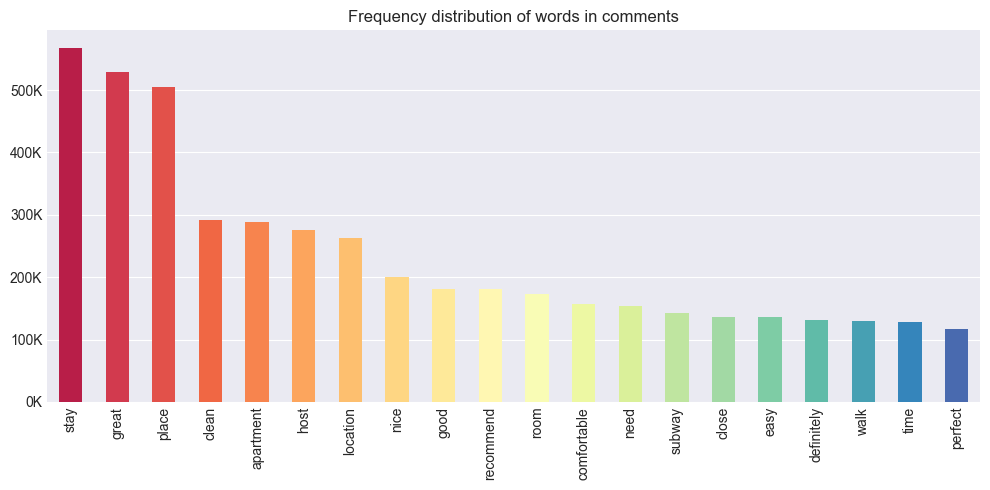

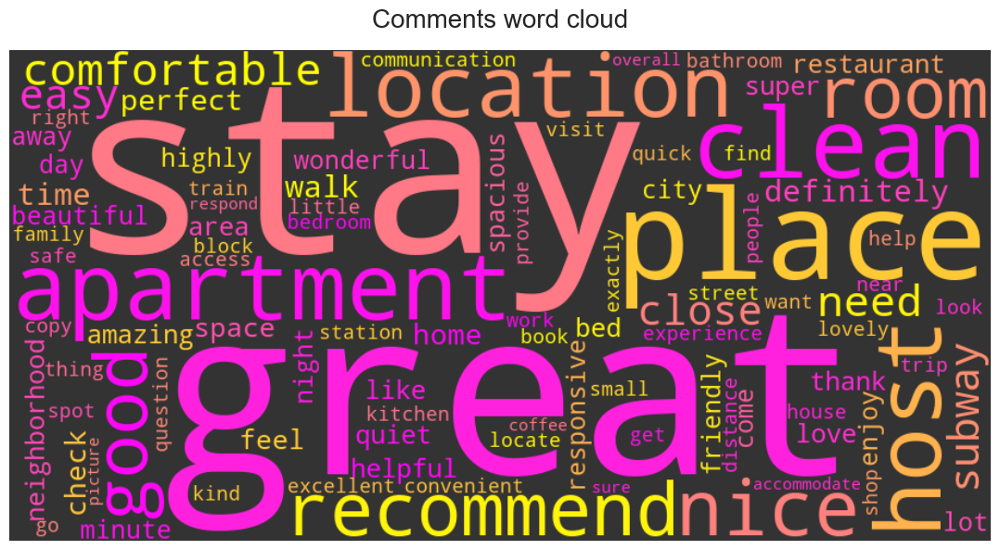

Aggregation...:   0%|          | 0/27840 [00:00<?, ?it/s]

In [38]:
# Define columns to check
columns = ["comments"]

# Define new column
new_columns = ["comments_clean", "comments_tokens"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_reviews.columns)):

    # Define columns to check
    columns = ["comments"]

    # Define new column
    new_columns = ["comments_clean", "comments_tokens"]

    # Fill NaN with empty string
    df_reviews[columns[0]].fillna("", inplace=True)

    # Change 'comments' column to string type
    df_reviews[columns[0]] = df_reviews[columns[0]].apply(str)

    # Detect language
    df_reviews[new_columns[0]] = detect_language(
        df_reviews[columns[0]], "Frequency of languages in comments"
    )

    # Spell correction
    df_reviews[new_columns[0]] = spell_correction(df_reviews[new_columns[0]])

    # Text cleaning
    df_reviews[new_columns[1]], df_reviews[new_columns[0]] = text_cleaning(
        list(df_reviews[new_columns[0]])
    )
    comments_tokens_list = list(chain(*df_reviews[new_columns[1]]))

    # Drop rows with empty tokens
    df_reviews = df_reviews[df_reviews[new_columns[1]].map(lambda x: len(x)) > 0]

    # Draw word frequency distribution chart
    word_freq(comments_tokens_list, "Frequency distribution of words in comments")

    # Draw word description word cloud
    word_cloud(comments_tokens_list, "Comments word cloud")

    # Drop 'comments' column
    df_reviews.drop(columns[0], axis=1, inplace=True, errors="ignore")

    # Aggregate df_reviews dataframe by listing id
    df_reviews_agg = df_reviews.groupby(["listing_id"]).agg(
        {
            new_columns[0]: " ".join,
            new_columns[1]: list,
        }
    )

    # Unnest the comment tokens
    tqdm.pandas(desc="Aggregation...", colour="green", position=0, leave=True)
    df_reviews_agg[new_columns[1]] = df_reviews_agg[new_columns[1]].progress_apply(
        lambda x: list(chain(*x))
    )

    # Reset index and rename column
    df_reviews_agg.reset_index(inplace=True)
    df_reviews_agg.rename(columns={"listing_id": "id"}, inplace=True)

else:
    # Load figures from disk
    fig1 = load_figure("Frequency of languages in comments")
    fig2 = load_figure("Frequency distribution of words in comments")
    fig3 = load_figure("Comments word cloud")

> As we could see, the majority of comments is in English. Comments not in English are 104 928 or 11%.

### Save Reviews Dataframe

> Next, we will save our datasets to the disk, so we can load them if the kernel goes down.

In [39]:
# Uncomment lines to save dataframes to disk
df_reviews.to_pickle(os.path.join(path_df, "reviews.pkl"))
df_reviews_agg.to_pickle(os.path.join(path_df, "reviews_agg.pkl"))

# Uncomment lines to load dataframes from disk
# df_reviews = pd.read_pickle(os.path.join(path_df, "reviews.pkl"))
# df_reviews_agg = pd.read_pickle(os.path.join(path_df, "reviews_agg.pkl"))

## Listings Dataframe

### Dataframe Description

> The listings.csv contains the following columns:
>- id - listing id
>- listing_url - listing url
>- scrape_id - scrape is
>- last_scraped - last scrapped
>- source - scrape source
>- name - listing name
>- description - listing description
>- neighborhood_overview - overview of neighborhood
>- picture_url - url of listing picture
>- host_id - host id
>- host_url - host url
>- host_name - host name
>- host_since - date that the host first joined Airbnb
>- host_location - host location
>- host_about - host about
>- host_response_time - average amount of time the host takes to reply to messages
>- host_response_rate - proportion of messages that the host replies to
>- host_acceptance_rate - hos acceptance rate
>- host_is_superhost - whether or not the host is a superhost
>- host_thumbnail_url - host thumbnail url
>- host_picture_url - host picture url
>- host_neighbourhood - host neighbourhood
>- host_listings_count - how many listings the host has in total last year
>- host_total_listings_count - how many listings the host has in total
>- host_verifications - host verifications types (email, phone etc.)
>- host_has_profile_pic - whether or not the host has profile pic
>- host_identity_verified - whether or not the host has been verified with id
>- neighbourhood - the neighbourhood
>- neighbourhood_cleansed - the borough the property is in
>- neighbourhood_group_cleansed - the district the property is in
>- latitude - latitude
>- longitude - longitude
>- property_type - type of property, e.g. house or flat
>- room_type - type of listing, e.g. entire home, private room or shared room
>- accommodates - how many people the property accommodates
>- bathrooms  - number of bathrooms
>- bathrooms_text - bathroom text description
>- bedrooms - number of bedrooms
>- beds - number of beds
>- amenities - list of amenities
>- price - nightly advertised price (the target variable)
>- minimum_nights - the minimum length of stay
>- maximum_nights - the maximum length of stay
>- minimum_minimum_nights - min-min nights
>- maximum_minimum_nights - max-min nights
>- minimum_maximum_nights - min-max nights
>- maximum_maximum_nights - max-max nights
>- minimum_nights_avg_ntm - min avg nights
>- maximum_nights_avg_ntm - max avg nights
>- calendar_updated - when the host last updated the calendar
>- has_availability - has availability
>- availability_30 - how many nights are available to be booked in the next 30 days
>- availability_60 - how many nights are available to be booked in the next 60 days
>- availability_90 - how many nights are available to be booked in the next 90 days
>- availability_365 - how many nights are available to be booked in the next 365 days 
>- calendar_last_scraped - last scraped date
>- number_of_reviews - the number of reviews left for the property
>- number_of_reviews_ltm - the number of reviews left for the property in the last twelve months
>- number_of_reviews_l30d - the number of reviews left for the property in the last thirty days
>- first_review - the date of the first review
>- last_review - the date of the most recent review
>- review_scores_rating - guests can score properties overall from 1 to 5 stars
>- review_scores_accuracy - guests can score the accuracy of a property's description from 1 to 5 stars
>- review_scores_cleanliness - guests can score a property's cleanliness from 1 to 5 stars
>- review_scores_checkin - guests can score their check-in from 1 to 5 stars
>- review_scores_communication - guests can score a host's communication from 1 to 5 stars
>- review_scores_location - guests can score a property's location from 1 to 5 stars
>- review_scores_value - guests can score a booking's value for money from 1 to 5 stars
>- license - whether or not the host has a license
>- instant_bookable - whether or not the property can be instant booked (i.e. booked straight away)
>- calculated_host_listings_count - calculated var how many listings the host has in total last year
>- calculated_host_listings_count_entire_homes - calculated var how many entire homes the host has in total last year
>- calculated_host_listings_count_private_rooms - calculated var how many private rooms the host has in total last year
>- calculated_host_listings_count_shared_rooms - calculated var how many shared rooms the host has in total last year
>- reviews_per_month - calculated field of the average number of reviews left by guest each month

### Data Cleaning, Preprocessing and Explanatory Analysis

#### Drop Columns with Redundant Information

> Some text columns will be dropped with redundand information for price prediction.

In [40]:
# Copy dataframe to work with
df_listings = df_listings_raw.copy()

# Create clean dataframe for machine learning (only numeric features)
df_listings_ml = pd.DataFrame()

# Drop columns
columns_to_drop = [
    "listing_url",  # redundant information with listing url
    "name",  # redundant information
    "picture_url",  # redundant information with picture url
    "neighborhood_overview",  # redundant information
    "scrape_id",  # redundant information with scrape id
    "host_id",  # redundant information with host id
    "host_url",  # redundant information with host url
    "host_name",  # redundant information with host name
    "host_picture_url",  # redundant information with host picture url
    "host_thumbnail_url",  # redundant information with thumbnail url
    "host_has_profile_pic",  # redundant information with host profile pic
    "host_neighbourhood",  # redundant information, duplicated with other columns
    "last_scraped",  # redundant information with last scraped
    "host_location",  # redundant information with host location
    "property_type",  # duplicated with "room_type"
    "bathrooms",  # 100% NaN values, duplicated with "bathroom_text"
    "source",  # redundant information with source
    "calendar_updated",  # redundant information with price date updated
    "neighbourhood",  # duplicated with information is in neighbourhood_cleansed and neighbourhood_group_cleansed
    "calendar_last_scraped",  # redundant information with calendar last scrapped
]
df_listings.drop(columns_to_drop, axis=1, inplace=True, errors="ignore")

> Let's go deep to the listings dataset columns.

#### Price column

> Let's convert the price to the integer values from string with a currency sign and look at price distribution.

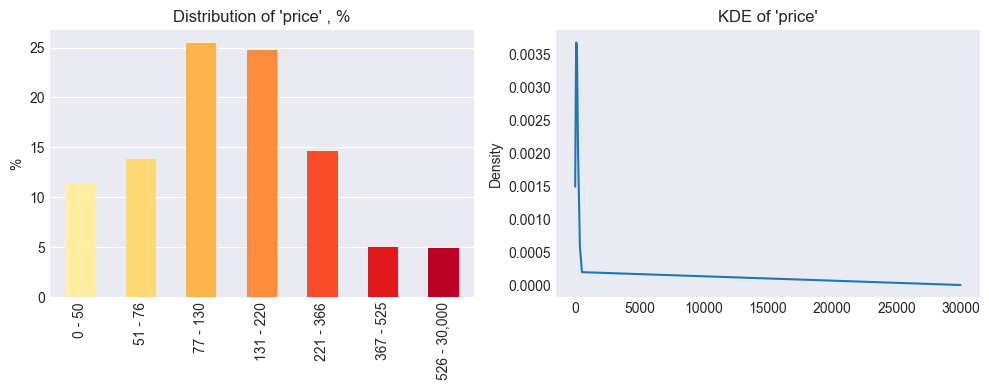

In [41]:
# Define columns to check
columns = ["price"]

# Convert price from string to numeric
df_listings[columns[0]] = convert_to_numeric(df_listings[columns[0]])

# Price column analysis
freq_desc(df_listings[columns[0]])

# Copy id and price columns to df_listings_ml
if len(df_listings_ml.columns) == 0:
    df_listings_ml = df_listings[["id", columns[0]]]
else:
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[0]]], "id", "id"
    )

> Looking at the pice distribution the listings' prices range from 0 USD to 30,000 USD. The price distribution is very skewed, so we need to normalize the prices for machine learning.

#### Guests reviews scores columns

> Let's examine the columns with guest review scores:  "review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value".

> Reviews columns are highly correlated and we could see, that listings that have no rating account for 1.43%. 95% of the listings have a rating of 4.0 or higher. The listing with a rating ranging from 3.0 to 4.0 represents 2.9%, from 2.0 to 3.0 - 0.55%, from 1.0 to 2.0 - 0,63%.

> So, we will drop "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value" columns and fill "review_scores_rating" column NaN values with mean score values.

> The average listing rating on Airbnb is 4.7, which is proven in many research papers.

> This is a serious sign to a host if the rating falls below 4.5 stars. If the average rating falls below 4.2 stars, the account is at risk of being suspended. If the rating drops to 4 stars or less, the listing could be permanently removed from Airbnb.

> In general, a 4.8 would be a good rating. If we consider the halfway point of the distribution to be the line of good and bad, 4.8 is roughly that threshold.

> Therefore, let us examine and categorize listings with a rating of 4.8 or higher as good, ranging from 4.5 to 4.7 as neutral, and below 4.5 as bad for classification machine learning task.

> The next step is to copy the listing ratings to our dataframe for machine learning and drop unnecessary columns from listings dataframe.

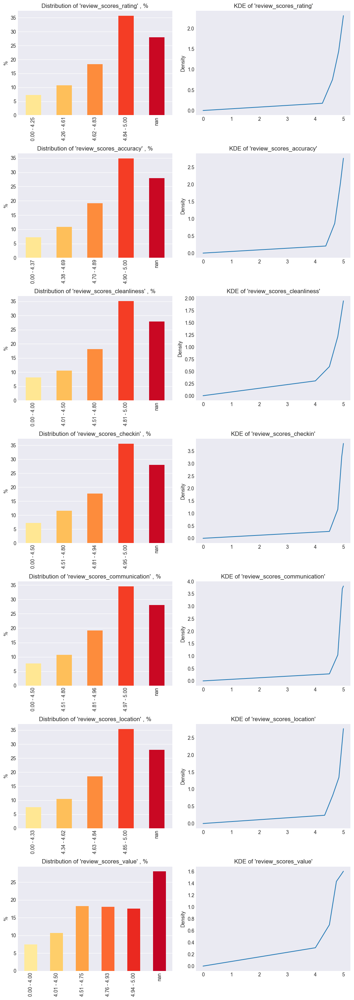

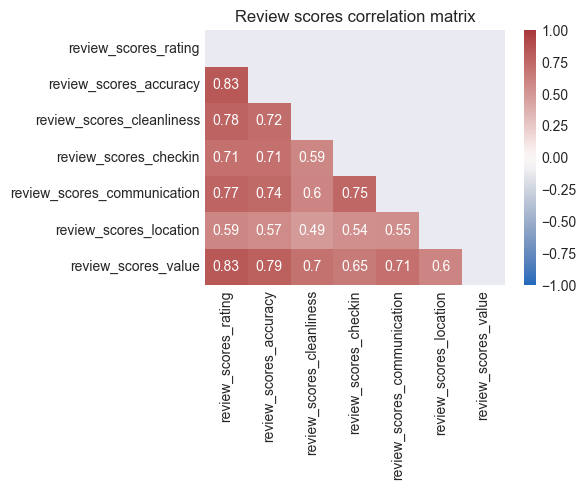

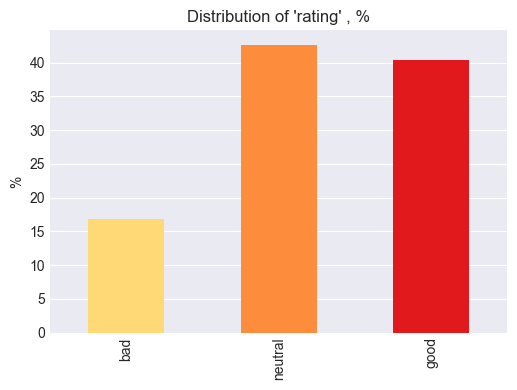

In [42]:
# Define columns to check
columns = [
    "review_scores_rating",
    "review_scores_accuracy",
    "review_scores_cleanliness",
    "review_scores_checkin",
    "review_scores_communication",
    "review_scores_location",
    "review_scores_value",
]

# Define new columns
new_columns = ["rating"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Plot frequency distribution
    freq_desc(df_listings[columns])

    # Plot correlation matrix
    find_corr(df_listings[columns], "Review scores correlation matrix")

    # Fill NaN values with mean
    df_listings[columns[0]].fillna(df_listings[columns[0]].mean(), inplace=True)

    # Segment review scores into bad, neutral and good ratings
    df_listings[new_columns[0]] = pd.DataFrame(
        {
            new_columns[0]: pd.cut(
                df_listings[columns[0]],
                bins=[-0.01, 4.59, 4.79, 5.01],
                labels=["bad", "neutral", "good"],
                ordered=True,
            ).values
        }
    )

    # Drop unnecessary columns from df_listings
    df_listings.drop(columns, axis=1, inplace=True, errors="ignore")

else:
    # Load and plot figures
    fig1 = load_figure(columns[0] + "_freq_desc")
    fig2 = load_figure("Review scores correlation matrix")

# Review scores rating analysis and add scores to other dfs
if new_columns[0] in df_listings.columns:

    # Perform review scores rating analysis
    freq_desc(df_listings[new_columns[0]])

    # Copy the review score to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", new_columns[0]]], "id", "id"
    )

    # Add review score to df_reviews_agg as target value
    df_reviews_agg = df_merge(
        df_reviews_agg, df_listings[["id", new_columns[0]]], "id", "id"
    )

else:
    # Load and plot figure
    fig3 = load_figure("rating_freq_desc")

# One-hot encoding in df_listings_ml
if new_columns[0] in df_listings_ml.columns:

    # Perform one-hot encoding for categorical column
    df_listings_ml = pd.get_dummies(df_listings_ml, columns=[new_columns[0]])

    # Drop column from df_listings_ml
    df_listings_ml.drop(new_columns[0], axis=1, inplace=True, errors="ignore")

#### Host_since column

> This column shows the date and time when the host was gegistered in the Airbnb platform. We will convert it to the number of days since the host was registered till now. Let's look at the analysis.

> We could see that the data is skewed and threre are NaN valuse. So, we will fill NaN values with 0 and consider the normalization and standartization methods to apply on host_since_days.

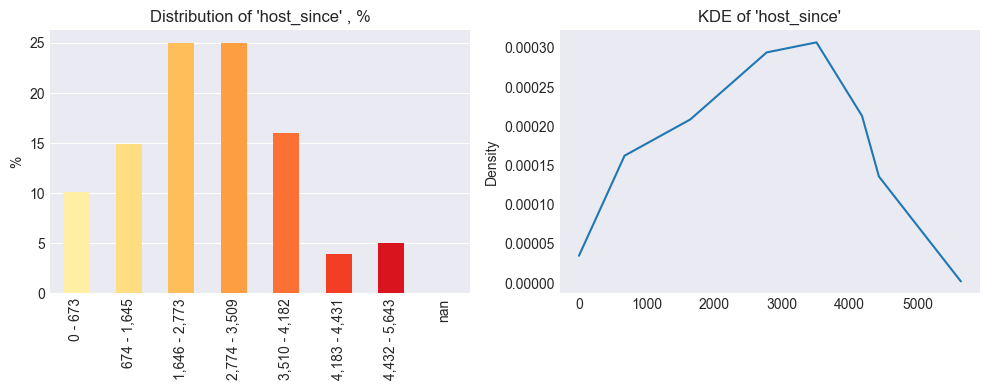

In [43]:
# Define columns to check
columns = ["host_since"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Convert to datetime
    df_listings[columns[0]] = convert_to_datetime(df_listings[columns[0]])

    # Calculate days till now
    df_listings[columns[0]] = days_till_now(df_listings[columns[0]])
    freq_desc(df_listings[columns])

    # Fill NaN values with 0
    df_listings[columns[0]].fillna(0, inplace=True)

    # Convert to integer
    df_listings[columns[0]] = convert_to_int(df_listings[columns[0]])

    # Merge with df_listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[0]]], "id", "id"
    )

    # Drop 'host_since' column
    df_listings.drop(columns[0], axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig = load_figure(columns[0] + "_freq_desc")

#### Host_about column

> 'Host_about' is a free-text descriptive information about hos. We will translate this column to bool, i.e. True if there is some information and False otherwise.

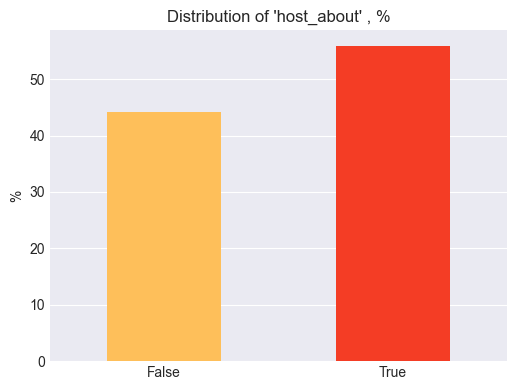

In [44]:
# Define columns to check
columns = ["host_about"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Convert to bool
    df_listings[columns[0]] = convert_to_bool(df_listings[columns[0]])

    # Perform analysis
    freq_desc(df_listings[columns])

    # Add the "host_about" to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[0]]], "id", "id"
    )

else:
    # Load figure from disk
    fig = load_figure(columns[0] + "_freq_desc")

#### Host_response_rate column

> Let's further analyze the "host_response_rate" column. This column tells us how accurate the host in his responses.
As we could see that 35% is NaN values, from 97% to 100% response rate is 49%, and other is below 17%. So we could drop the "host_response_rate" column from our prediction model due to the little or no effect.

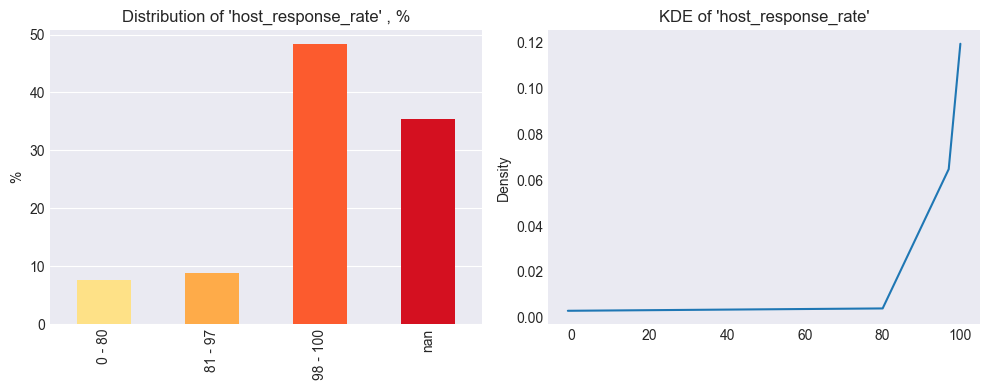

In [45]:
# Define columns to check
columns = ["host_response_rate"]

# # Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Convert to numeric
    df_listings[columns[0]] = convert_to_numeric(df_listings[columns[0]])

    # Perform analysis
    freq_desc(df_listings[columns])

    # Drop 'host_response_rate' column
    df_listings.drop(columns[0], axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig = load_figure(columns[0] + "_freq_desc")

#### Host_acceptance_rate column

> A similar story is true for "host_acceptance_rate" column. This column tells us how often the host accepts the guests requests. As the acceptance rate from 75% to 100% is 53% and 31% is NaN values, we will drop the "host_acceptance_rate" column.

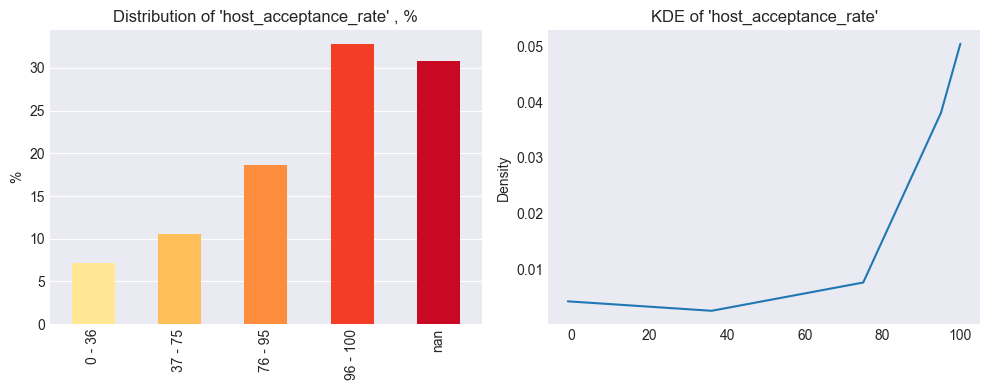

In [46]:
# Define columns to check
columns = ["host_acceptance_rate"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Convert to numeric
    df_listings[columns[0]] = convert_to_numeric(df_listings[columns[0]])

    # Perform analysis
    freq_desc(df_listings[columns])

    # Drop 'host_acceptance_rate' column
    df_listings.drop(columns[0], axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig = load_figure(columns[0] + "_freq_desc")

#### Host_response_time column

> We could observe that 35% of hosts respond within a few hours, and 35% are NaN values. So, we could drop this column due to the little or no effect on price prediction.

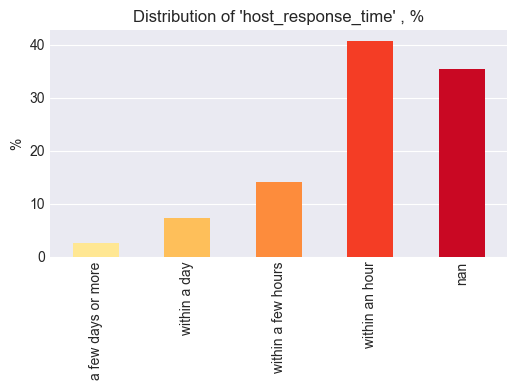

In [47]:
# Define columns to check
columns = ["host_response_time"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Perform analysis
    freq_desc(df_listings[columns])

    # Drop 'host_response_time' column
    df_listings.drop(columns[0], axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig = load_figure(columns[0] + "_freq_desc")

#### Host_is_superhost column

> We could see that 21% of hosts are superhosts. So, let's add this feature to our prediction model and check if it has some effect.

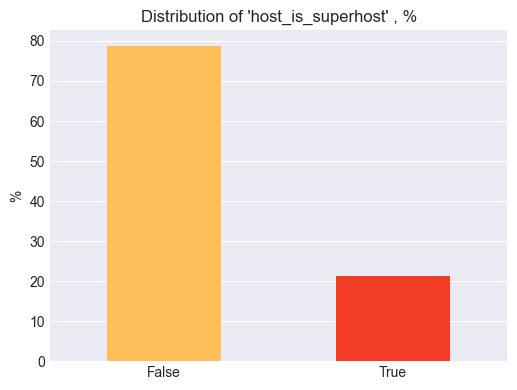

In [48]:
# Define columns to check
columns = ["host_is_superhost"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Replace "f" and "t" with False and True
    df_listings[columns[0]].replace({"f": False, "t": True}, inplace=True)

    # Perform analysis
    freq_desc(df_listings[columns])

    # Add the "host_is_superhost" to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[0]]], "id", "id"
    )

else:
    # Load figure from disk
    fig = load_figure(columns[0] + "_freq_desc")

#### License column

> 87% of "license" column has NaN values, so we will drop this column.

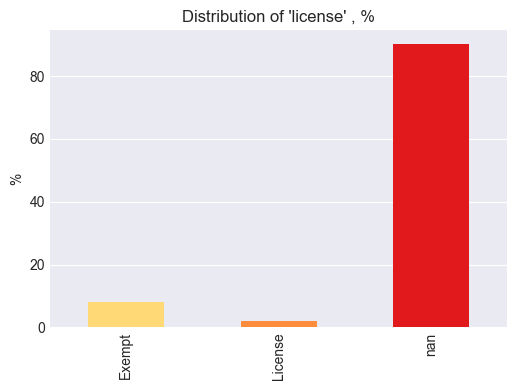

In [49]:
# Define columns to check
columns = ["license"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Replace license number with general "License" string
    df_listings[columns[0]].replace(
        to_replace=r"[Oo][Ss][Ee].*", value="License", regex=True, inplace=True
    )

    # Perform analysis
    freq_desc(df_listings[columns])

    # Drop 'license' column
    df_listings.drop(columns[0], axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig = load_figure(columns[0] + "_freq_desc")

#### Host_verifications and host_identity_verified columns

> We could observe that "host_verifications" and "host_identity_verified" columns are identical for price prediction purpose. So, we will preprocess "host_identity_verified" and add it to df_listings_ml, and drop "host_verifications" column.

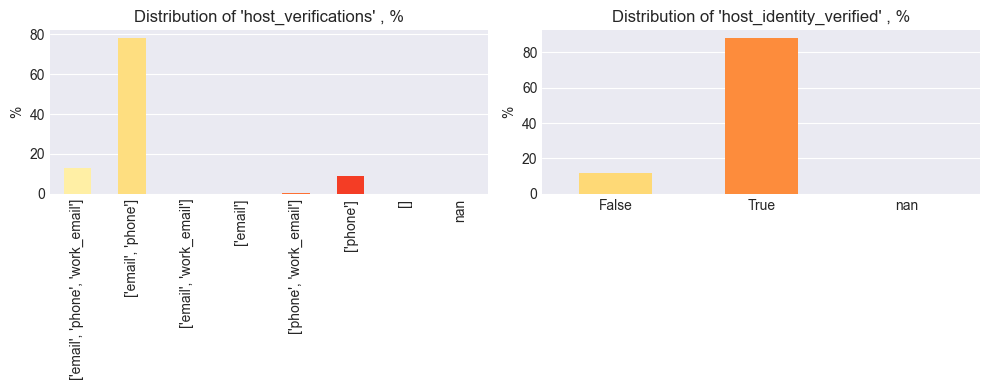

In [50]:
# Define columns to check
columns = ["host_verifications", "host_identity_verified"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Replace "f" and "t" with False and True
    df_listings[columns[1]].replace({"f": False, "t": True}, inplace=True)

    # Perform analysis
    freq_desc(df_listings[columns])

    # Fill NaN values with False
    df_listings[columns[1]].fillna(False, inplace=True)

    # Add the "host_identity_verified" to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[1]]], "id", "id"
    )

    # Drop 'host_verifications' column
    df_listings.drop(columns[0], axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig = load_figure(columns[0] + "_freq_desc")

#### Minimum and maximum nights columns

> We can observe that 88,3% of listings rent for minimum 1-5 days, 46% for maximum more than 1 year, and 38% for more than half an year. Also all these columns are highly correlated.

> So, these columns are redundant and we will drop it.

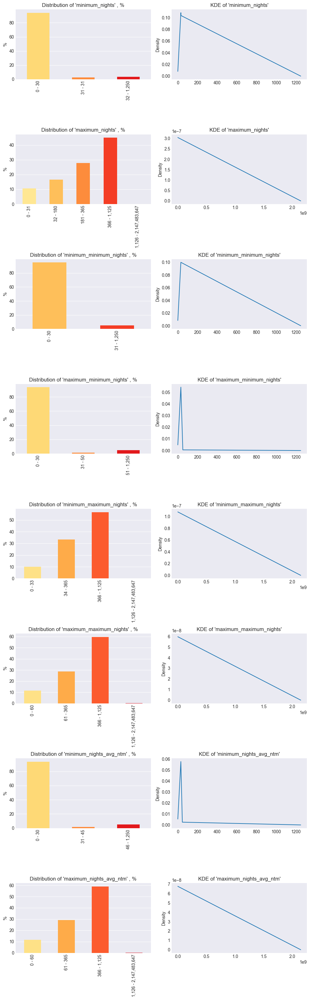

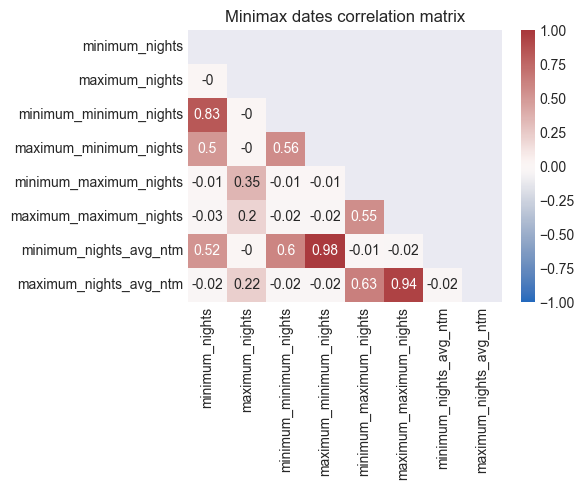

In [51]:
# Define columns to check
columns = [
    "minimum_nights",
    "maximum_nights",
    "minimum_minimum_nights",
    "maximum_minimum_nights",
    "minimum_maximum_nights",
    "maximum_maximum_nights",
    "minimum_nights_avg_ntm",
    "maximum_nights_avg_ntm",
]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Perform analysis
    freq_desc(df_listings[columns])
    find_corr(df_listings[columns], "Minimax dates correlation matrix")

    # Drop columns
    df_listings.drop(columns, axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig1 = load_figure(columns[0] + "_freq_desc")
    fig2 = load_figure("Minimax dates correlation matrix")

#### Room_type column

> We can observe that 53% of listings are entire home or appartment, and 43% are private rooms. The shared rooms and hotel rooms are less than 3%.

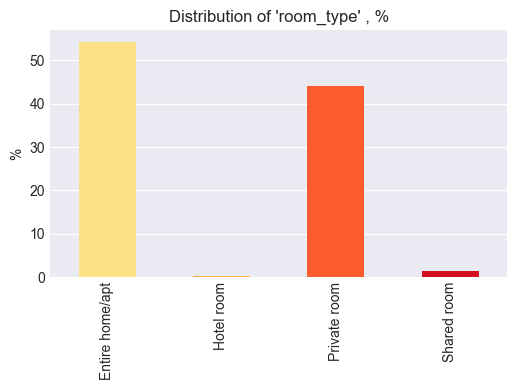

In [52]:
# Define columns to check
columns = ["room_type"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Perform analysis
    freq_desc(df_listings[columns])

    # Add the "room_type" to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[0]]], "id", "id"
    )

else:
    # Load figure from disk
    fig1 = load_figure(columns[0] + "_freq_desc")

# One-hot encoding
if columns[0] in df_listings_ml.columns:

    # Perform one-hot encoding for categorical column
    df_listings_ml = pd.get_dummies(df_listings_ml, columns=[columns[0]])

    # Drop column from df_listings_ml
    df_listings_ml.drop(columns[0], axis=1, inplace=True, errors="ignore")

#### Bathrooms_text column

> Further let's look at the "bathrooms_text" column. We can see, that this is a column with strings, where the number of baths from 0 to 8.5 with a 0.5 step is shown. Also, in this column there is information if the bath is private or shared one.

> We will extract the float number from the column with a regular expression and assign it to the new column. And also we will define whether is bathroom private or shared, and assign the bathroom class to the new column.

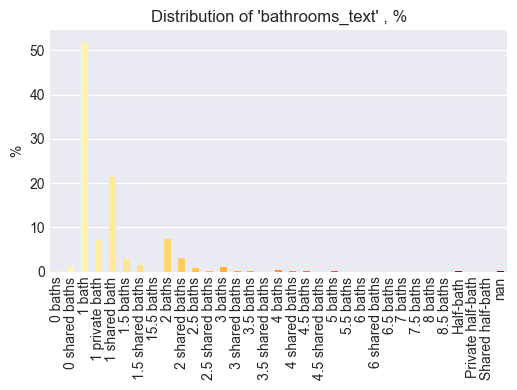

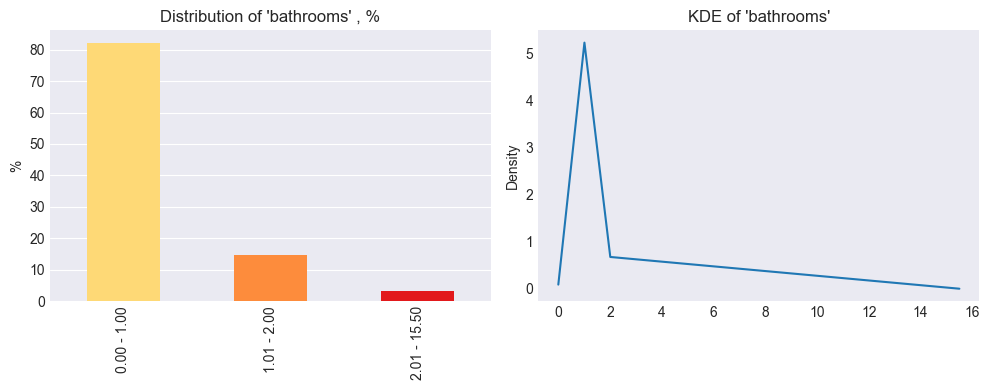

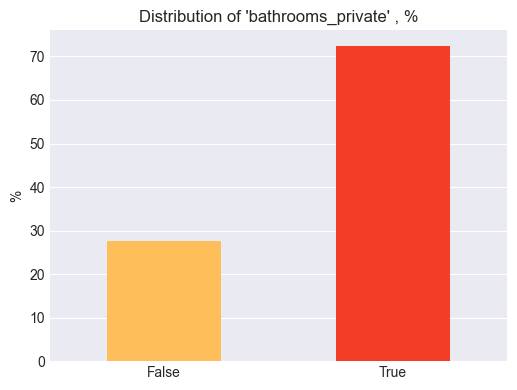

In [53]:
# Define columns to check
columns = ["bathrooms_text"]

# Define new columns
new_columns = ["bathrooms", "bathrooms_private"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Perform analysis
    freq_desc(df_listings[columns])

    # Fill NaN values with "0"
    df_listings[columns[0]].fillna("0", inplace=True)

    # Replace "Half-bath" with "0.5"
    df_listings[columns[0]].replace(
        to_replace="[Hh]alf-bath",
        value="0.5",
        inplace=True,
        regex=True,
    )

    # Extract numbers or floats from string
    df_listings[new_columns[0]] = df_listings[columns[0]].str.extract(
        "([-+]?\d*\.?\d+)"
    )

    # Convert to float
    df_listings[new_columns[0]] = df_listings[new_columns[0]].astype("float")

    # Define if the bathroom shared or private
    df_listings[new_columns[1]] = ~df_listings[columns[0]].str.contains(
        "shared", case=False, regex=True, na=False
    )

    # Plot frequency distribution after preprocessing
    freq_desc(df_listings[new_columns[0]])
    freq_desc(df_listings[new_columns[1]])

    # Add new columns to listings_ml
    new_columns.append("id")
    df_listings_ml = df_merge(df_listings_ml, df_listings[new_columns], "id", "id")

    # Drop columns
    df_listings.drop(columns, axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig1 = load_figure(columns[0] + "_freq_desc")
    fig2 = load_figure(new_columns[0] + "_freq_desc")
    fig3 = load_figure(new_columns[1] + "_freq_desc")

#### Bedrooms, beds and accommodates columns

> Let's examine the three columns with the similar meaning: "bedrooms", "beds" and "accommodates".

> From the graphs we can observe, that these columns are highle correlated. The "bedrooms" column has low-quality information - the NaN values are accounted up to 42%. The "beds" column is more informative, because NaN values are only 3%. But the distribution for this column is very skewed.

> The "accomodates" column seems to has the highest quality: no NaN values and not so skewed as "beds". And "accomodates" seems to be the most meaningful. We will use this column in price prediction.

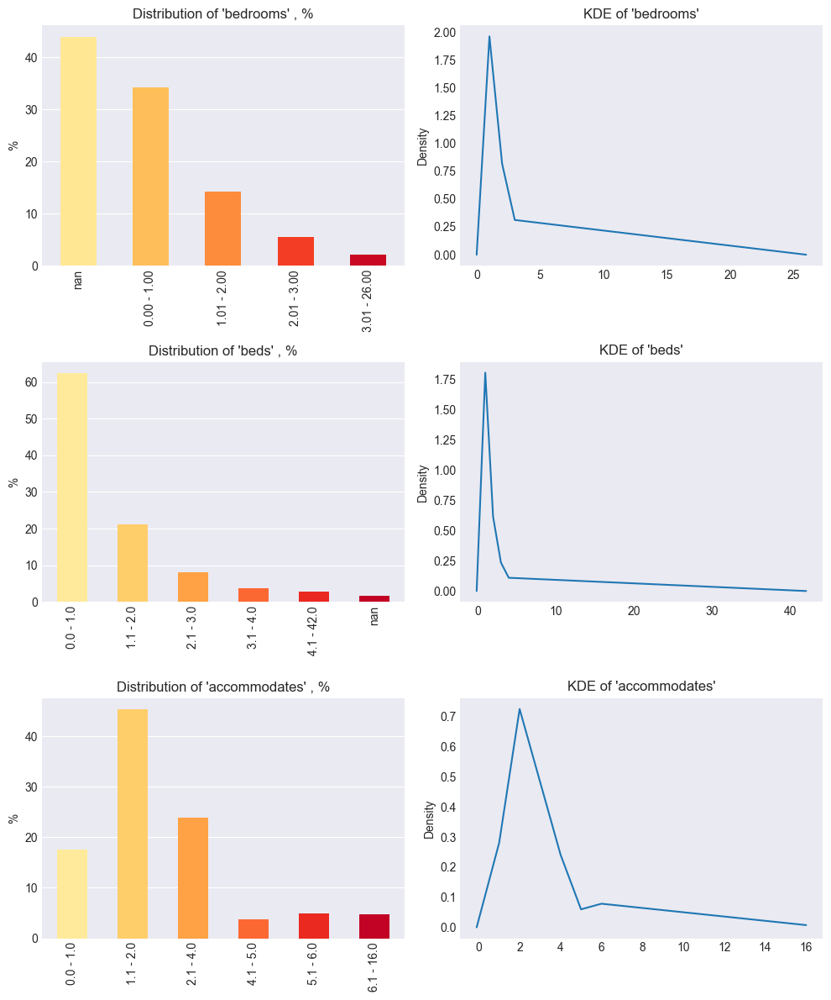

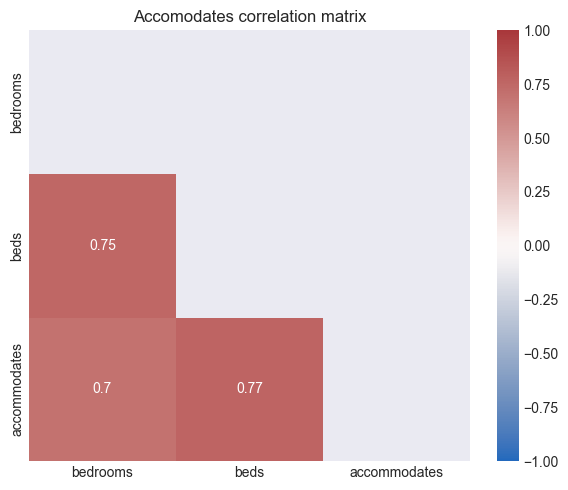

In [54]:
# Define columns to check
columns = ["bedrooms", "beds", "accommodates"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Perform analysis
    freq_desc(df_listings[columns])
    find_corr(df_listings[columns], "Accomodates correlation matrix")

    # Add new column to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[2]]], "id", "id"
    )

    # Drop redundant columns
    df_listings.drop(columns[:2], axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig1 = load_figure(columns[0] + "_freq_desc")
    fig2 = load_figure("Accomodates correlation matrix")

#### Instant_bookable column

> Let's examine the instant_bookable_column. The 80% of listings are instant bookable.

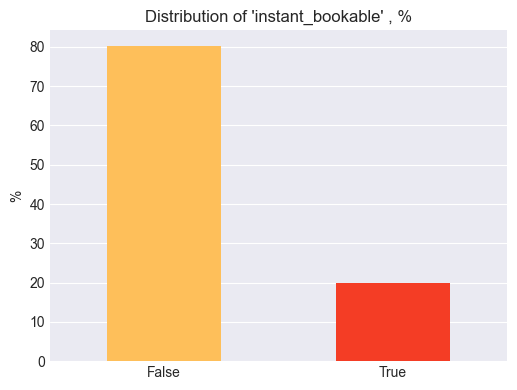

In [55]:
# Define columns to check
columns = ["instant_bookable"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Replace "f" and "t" with False and True
    df_listings[columns[0]].replace({"f": False, "t": True}, inplace=True)

    # Perform analysis
    freq_desc(df_listings[columns])

    # Add "instant_bookable" column to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[0]]], "id", "id"
    )

else:
    # Load figure from disk
    fig = load_figure(columns[0] + "_freq_desc")

#### Reviews_per_month, number_of_reviews, number_of_reviews_ltm, number_of_reviews_l30d columns

> Let's figure out how often guests review listings.

> As we could see, the mean value for each listing is 1.52 reviews per month and the highest number is 63. This indicates that people like to leave comments, and it's important for listings. 27% of listings has NaN values for reviews per month.

> The 28% of listings has no reviews. 24% from 1 to 4 reviews, and 23% from 4 to 23 reviews. 5% of listings has more than 129 reviews.

> As for number_of_reviews_ltm and number_of_reviews_l30d, it has very high zeros number: 55% and 82% retrospectively. 

> The graph shows that columns are highly correlated.

> The number of reviews column seems to has the highest data quality - no NaN values. So, we will use this data for future work and drop other columns.

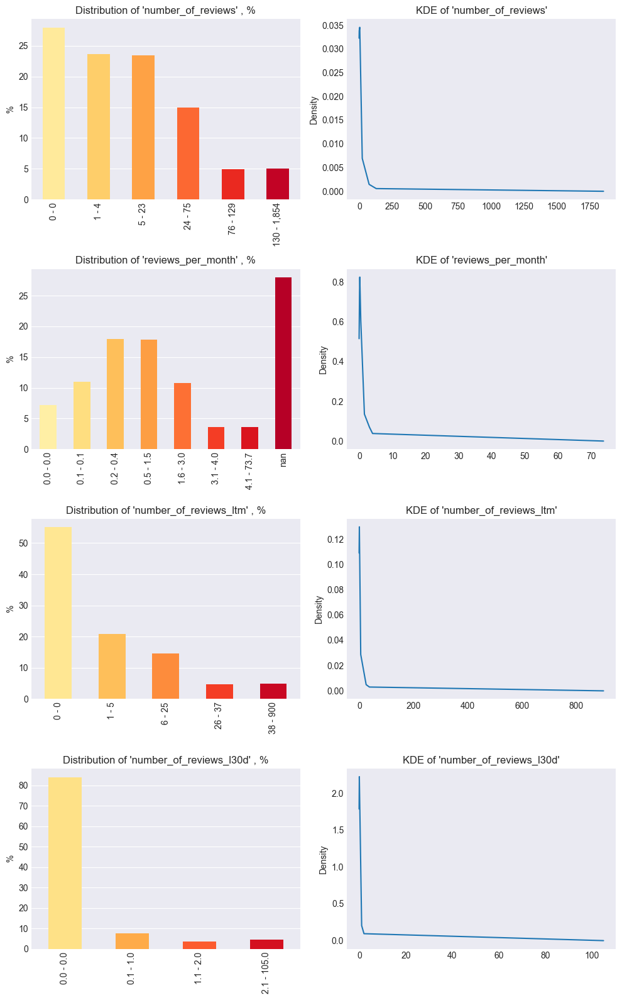

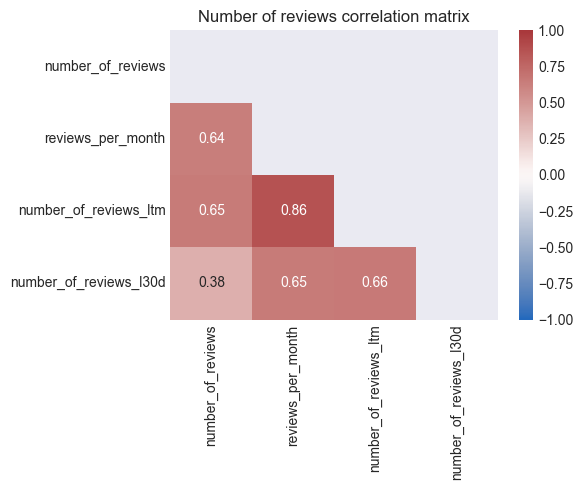

In [56]:
# Define columns to check
columns = [
    "number_of_reviews",
    "reviews_per_month",
    "number_of_reviews_ltm",
    "number_of_reviews_l30d",
]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Perform analysis
    freq_desc(df_listings[columns])
    find_corr(df_listings[columns], "Number of reviews correlation matrix")

    # Add "number_of_reviews" column to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[0]]], "id", "id"
    )

    # Drop redundant columns
    df_listings.drop(columns[1:], axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig1 = load_figure(columns[0] + "_freq_desc")
    fig2 = load_figure("Number of reviews correlation matrix")

#### Host listings count column

> Further we look as host listings count column. As we can see, the data has a bad quality and has low prediction power. We will drop it.

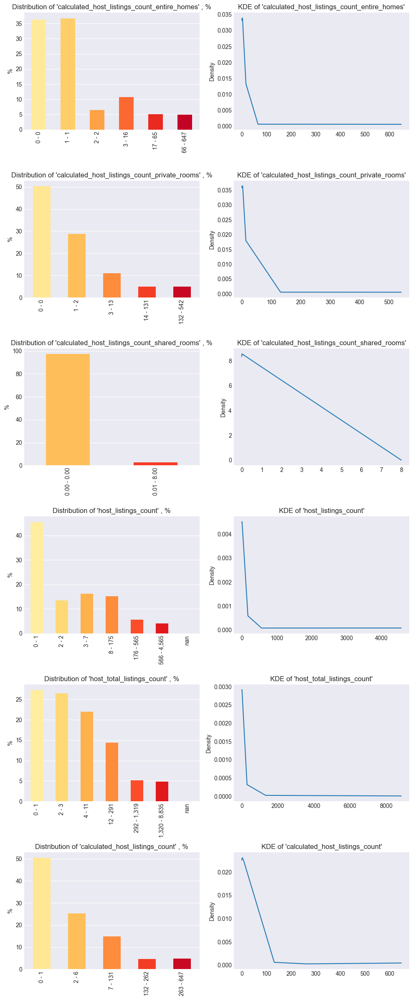

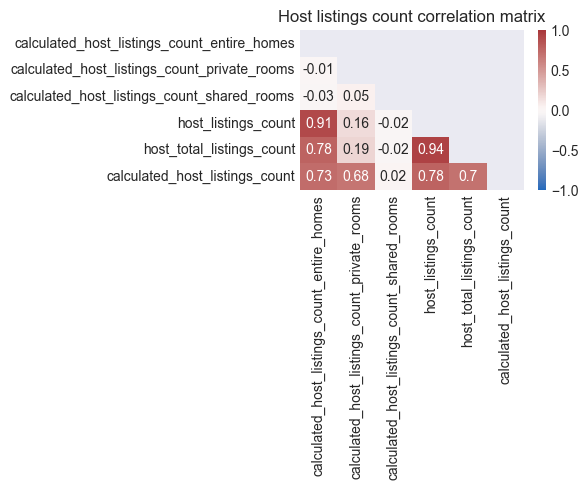

In [57]:
# Define columns to check
columns = [
    "calculated_host_listings_count_entire_homes",
    "calculated_host_listings_count_private_rooms",
    "calculated_host_listings_count_shared_rooms",
    "host_listings_count",
    "host_total_listings_count",
    "calculated_host_listings_count",
]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Perform analysis
    freq_desc(df_listings[columns])
    find_corr(df_listings[columns], "Host listings count correlation matrix")

    # Drop redundant columns
    df_listings.drop(columns, axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig1 = load_figure(columns[0] + "_freq_desc")
    fig2 = load_figure("Host listings count correlation matrix")

#### Has_availability, availability_30, availability_60, availability_90 and availability_365 columns

> As we can see, the availability columns has data with low quality and the columns are highly correlated.We will drop it.

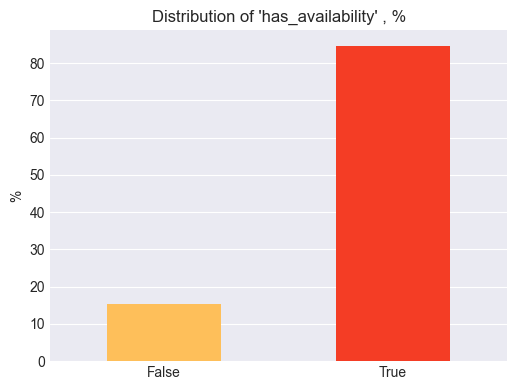

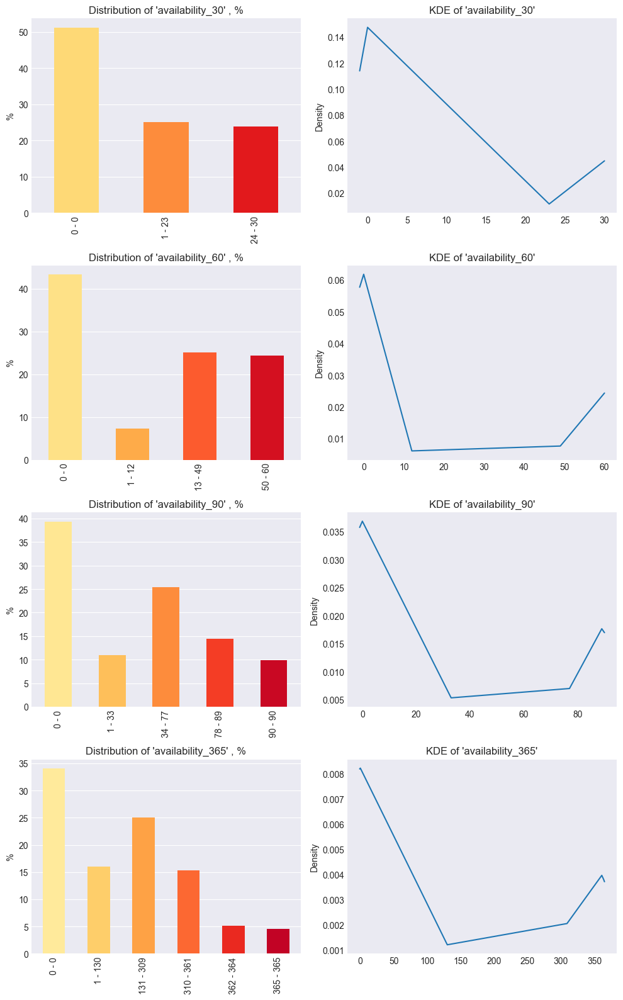

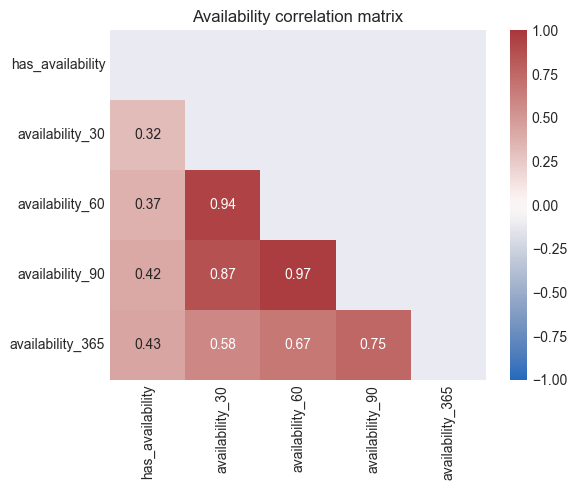

In [58]:
# Define columns to check
columns = [
    "has_availability",
    "availability_30",
    "availability_60",
    "availability_90",
    "availability_365",
]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Replace "f" and "t" with False and True
    df_listings[columns[0]].replace({"f": False, "t": True}, inplace=True)

    # Perform analysis
    freq_desc(df_listings[columns[0]])
    freq_desc(df_listings[columns[1:]])
    find_corr(df_listings[columns], "Availability correlation matrix")

    # Drop redundant columns
    df_listings.drop(columns, axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig1 = load_figure(columns[0] + "_freq_desc")
    fig2 = load_figure(columns[1] + "_freq_desc")
    fig3 = load_figure("Availability correlation matrix")

#### First_review and last_review column

> The first_review and last_review columns are highly correlated. We will leave only last_revew date and convert it to daya from now.

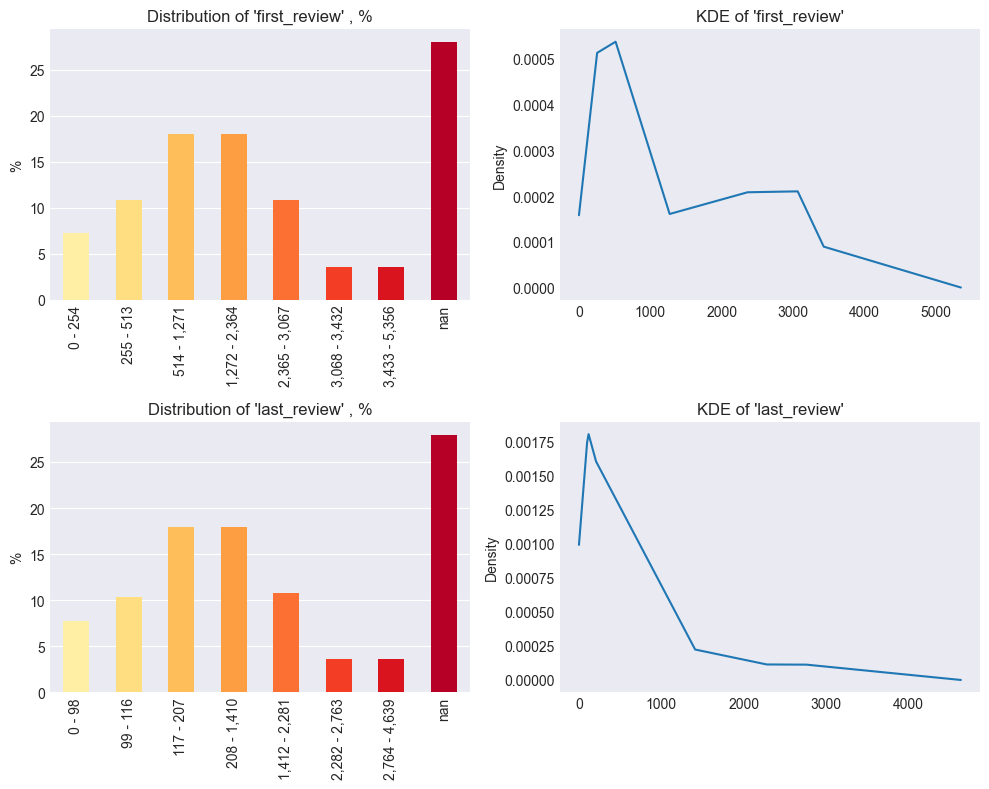

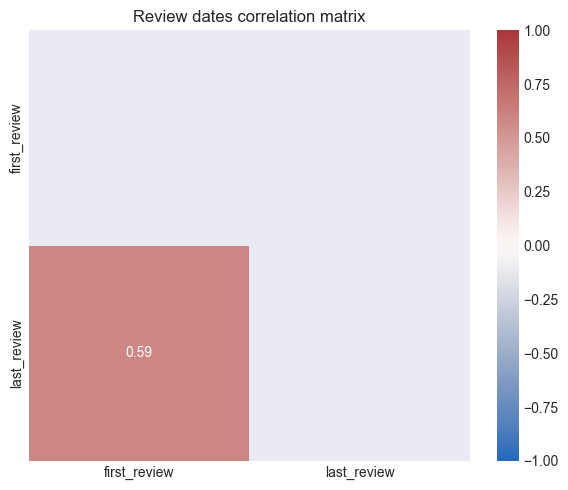

In [59]:
# Define columns to check
columns = ["first_review", "last_review"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Convert to datetime and calculates the days till now
    for col in columns:
        df_listings[col] = convert_to_datetime(df_listings[col])
        df_listings[col] = days_till_now(df_listings[col])

    # Perform analysis
    freq_desc(df_listings[columns])
    find_corr(df_listings[columns], "Review dates correlation matrix")

    # Fill NaN values with the mean
    df_listings[columns[1]].fillna(df_listings[columns[1]].mean(), inplace=True)

    # Convert to integer
    df_listings[columns[1]] = convert_to_int(df_listings[columns[1]])

    # Add "last_review" column to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[1]]], "id", "id"
    )

    # Drop 'last_review' column
    df_listings.drop(columns[0], axis=1, inplace=True, errors="ignore")

else:
    # Load figure from disk
    fig1 = load_figure(columns[0] + "_freq_desc")
    fig2 = load_figure("Review dates correlation matrix")

#### Description column

> The listing description column is a free-text column with a text description of listing, written by the host. As it has a text, we will perform the sentiment analysis on listing description after the preprocessing. We will utilize the VADER or Valence Aware Dictionary and Sentiment Reasoner for sentiment analysis.

> VADER is a rule-based sentiment analysis tool. It was specifically tailored to the sentiments expressed on social media platforms. It can handle different types of text, so it is a popular choice for analyzing feelings without supervision.

Detect language:   0%|          | 0/39160 [00:00<?, ?it/s]

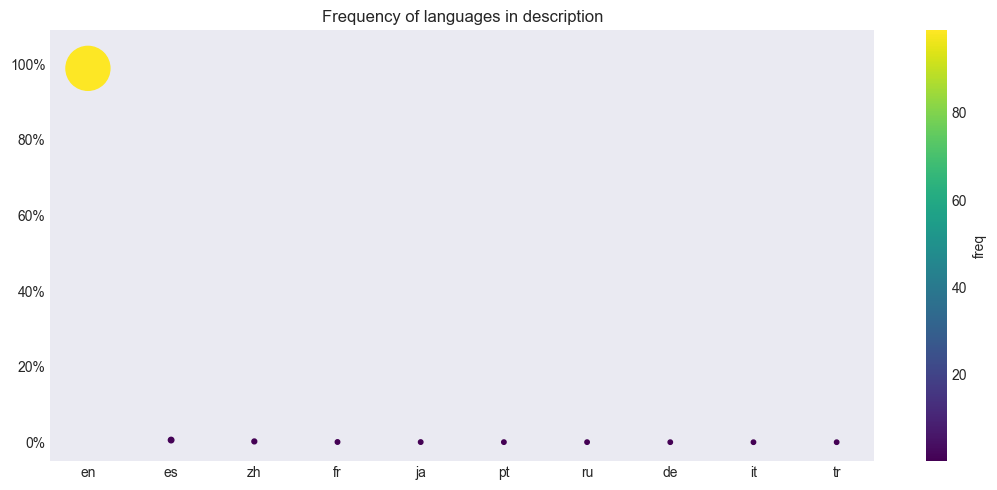

Spell correction:   0%|          | 0/39160 [00:00<?, ?it/s]

Text preprocessing:   0%|          | 0/39160 [00:00<?, ?it/s]

Vader sentiment analysis:   0%|          | 0/39160 [00:00<?, ?it/s]

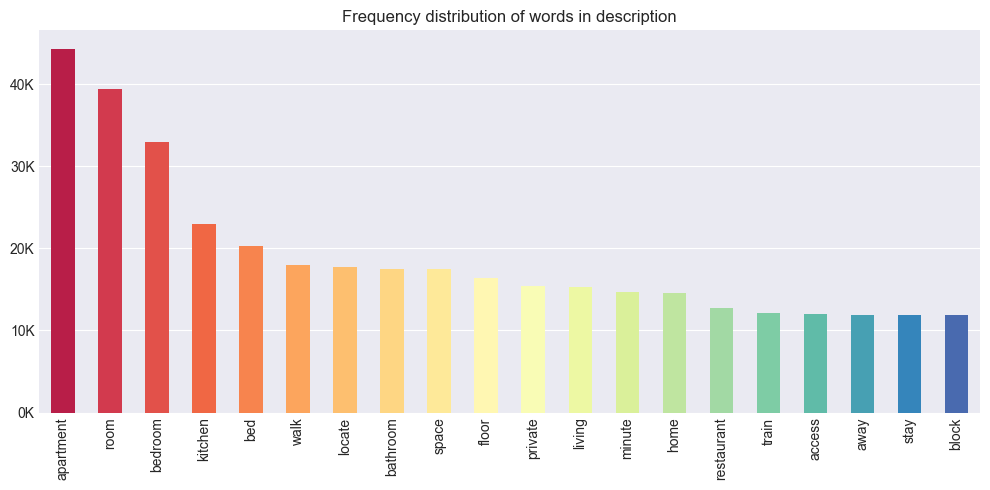

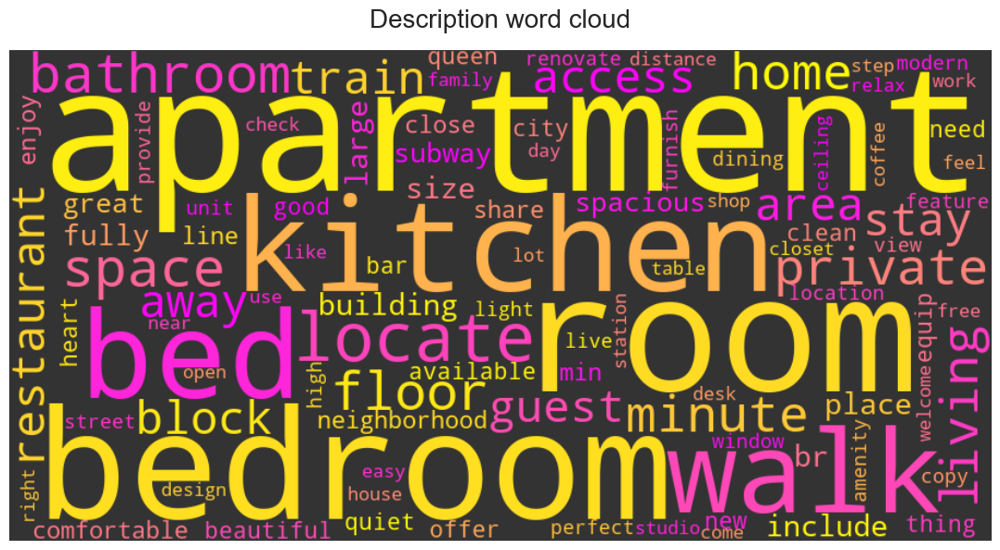

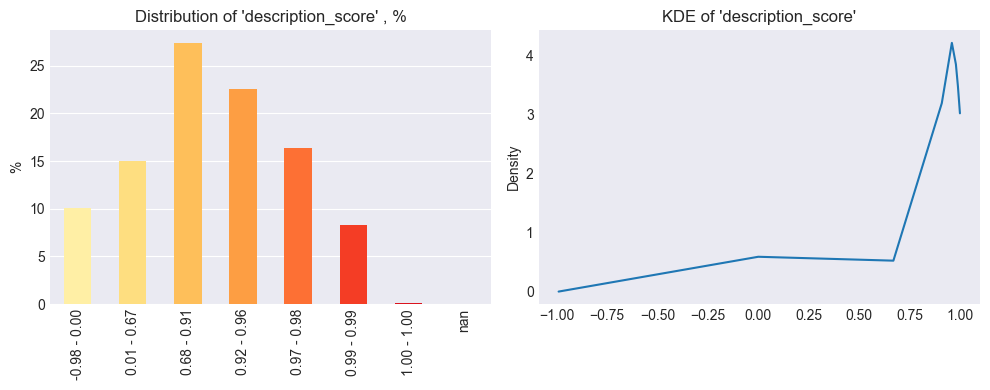

In [60]:
# Define columns to check
columns = ["description"]

# Define new column
new_columns = ["description_clean", "description_score"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Copy column to avoid unnecessary calculations when re-run notebook cell
    df_listings[new_columns[0]] = df_listings[columns[0]]

    # Fill NaN with empty string
    df_listings[new_columns[0]].fillna("", inplace=True)

    # Change 'comments' column to string type
    df_listings[new_columns[0]] = df_listings[new_columns[0]].apply(str)

    # Detect language
    df_listings[new_columns[0]] = detect_language(
        df_listings[new_columns[0]], "Frequency of languages in description"
    )

    # Spell correction
    df_listings[new_columns[0]] = spell_correction(df_listings[new_columns[0]])

    # Text cleaning
    description_clean_tokens, df_listings[new_columns[0]] = text_cleaning(
        list(df_listings[new_columns[0]])
    )
    description_tokens_list = list(chain(*description_clean_tokens))

    # Calculate Vader sentiment score
    tqdm.pandas(desc="Vader sentiment analysis", colour="green", position=0, leave=True)
    df_listings[new_columns[1]] = df_listings[new_columns[0]].progress_apply(
        lambda x: getSentimentScoreVader(x)
    )

    # Fill NaN values with mean
    df_listings[new_columns[1]].fillna(df_listings[new_columns[1]].mean(), inplace=True)

    # Draw word frequency distribution chart
    word_freq(description_tokens_list, "Frequency distribution of words in description")

    # Draw word description word cloud
    word_cloud(description_tokens_list, "Description word cloud")

    # Add "description_score" column to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", new_columns[1]]], "id", "id"
    )

    # Perform analysis of sentiment scores
    freq_desc(df_listings[new_columns[1]])

    # Drop 'description' column
    df_listings.drop(columns[0], axis=1, inplace=True, errors="ignore")

    # Drop 'description_clean' column
    df_listings.drop(new_columns[0], axis=1, inplace=True, errors="ignore")

else:
    # Load figures from disk
    fig1 = load_figure("Frequency of languages in description")
    fig2 = load_figure("Frequency distribution of words in description")
    fig3 = load_figure("Description word cloud")
    fig4 = load_figure(new_columns[1] + "_freq_desc")

#### Amenities column

> Amenities is a list of additional features in the property, i.e. whether it has a TV or parking.

> First, we will preprocess the amenities, because it has unproper format.

> Secondly, we will aggregate the amenities into groups with similar meanings.

> And finally, we define the most common amenities and perform dummy encoding (e.g. add columns with amenities and set True of False depends on if the listing has this amenity or not.

Amenities preprocess:   0%|          | 0/39160 [00:00<?, ?it/s]

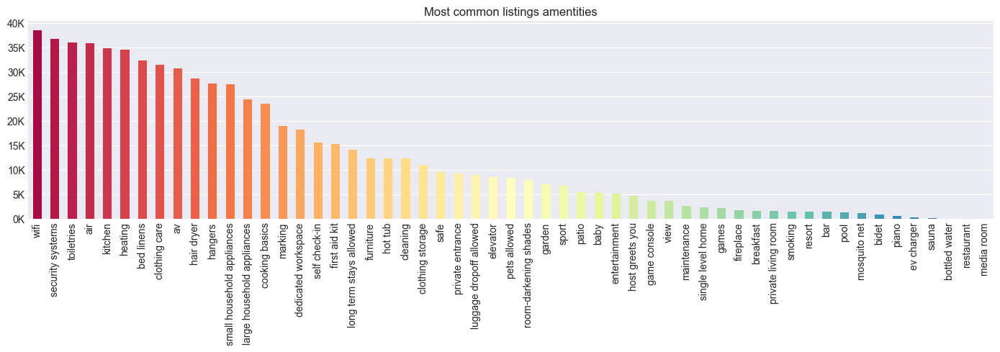

In [61]:
# Define columns to check
columns = ["amenities"]

# Perform preprocessing and analysis if columns are in dataframe or load figure if not
if set(columns).issubset(set(df_listings.columns)):

    # Convert column to list from object type
    df_listings[columns[0]] = df_listings[columns[0]].apply(ast.literal_eval)

    # Amenities preprocess
    tqdm.pandas(desc="Amenities preprocess", colour="green", position=0, leave=True)
    df_listings[columns[0]] = df_listings[columns[0]].progress_apply(
        lambda x: elements_agg(x, amentities_dict)
    )

    # Remove duplicates
    df_listings[columns[0]] = df_listings[columns[0]].apply(lambda x: list(set(x)))

    # Explode to list
    amenity_list = df_listings[columns[0]].explode().to_list()

    # Remove NaN values
    amenity_counter = Counter([a for a in amenity_list if str(a) != "nan"])

    counter_plot(amenity_counter, "Most common listings amentities")

    # Define threshold
    amenity_threshold = 0.05
    amenity_threshold = amenity_threshold * len(df_listings[columns[0]])

    # Create a list with most common amentities
    most_common_amenity_list = []
    for key, value in amenity_counter.items():
        if value > amenity_threshold:
            most_common_amenity_list.append(key)

    # Add "amenities" column to listings_ml
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[0]]], "id", "id"
    )

    # Create columns with amenity categories (boolean)
    for amenity in most_common_amenity_list:
        df_listings_ml = df_listings_ml.assign(
            **{
                amenity: lambda x: x[columns[0]].apply(
                    lambda y: True if any(amenity in x for x in y) else False
                )
            }
        )

    # Drop 'amenities' column from df_listings_ml
    df_listings_ml.drop([columns[0]], axis=1, inplace=True, errors="ignore")

    # Drop 'amenities' column
    df_listings.drop([columns[0]], axis=1, inplace=True, errors="ignore")

else:
    # Load figures from disk
    fig = load_figure("Most common listings amentities")

#### Neighbourhood columns

> The New York City encompasses Five county-level administrative divisions called "Boroughs": 
> 1. Bronx 
> 2. Brooklyn
> 3. Manhattan
> 4. Queens
> 5. Staten Island  

> We can observe that the number of Airbnb Listings in each borough is what influences the price and there are more number of Airbnb listing in Manhattan and Brooklyn.

> It is evident that the most priced Airbnb listings are located in Manhattan and Brooklyn and the rest of boroughs are regularly proportionate and all of them have the about same price.

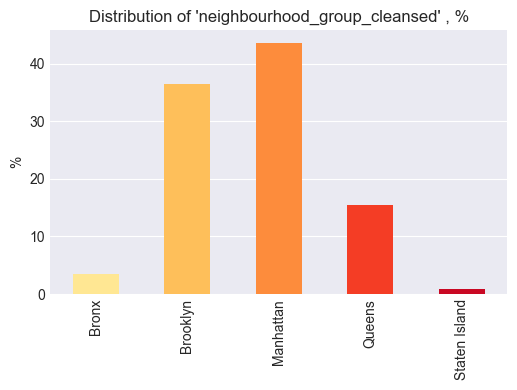

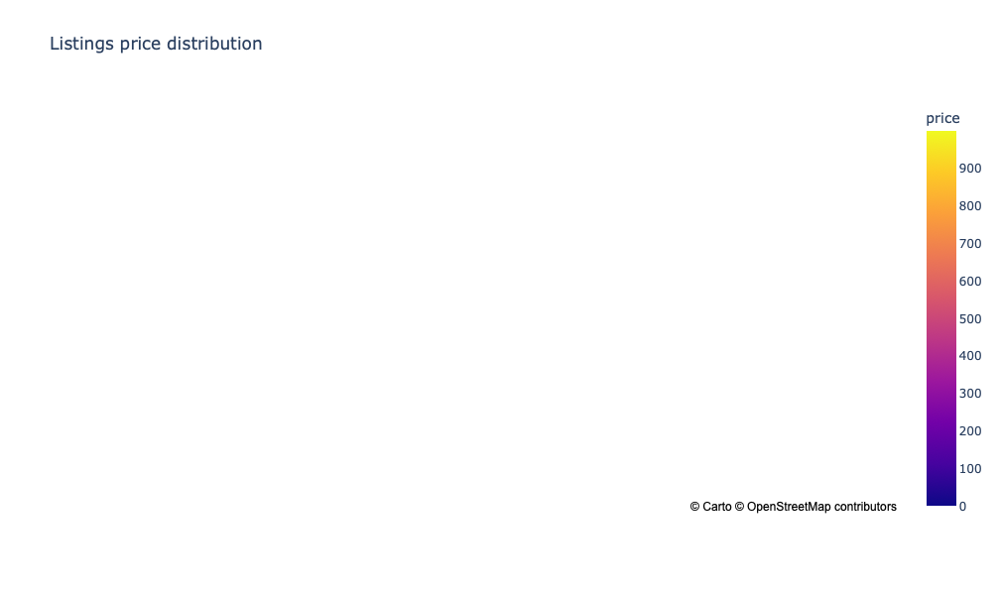

In [62]:
# Define columns to check
columns = ["neighbourhood_cleansed", "neighbourhood_group_cleansed"]

# Perform analysis
freq_desc(df_listings[columns[1]])

# Plot the listing price distribution (price < $1000)
fig = px.scatter_mapbox(
    data_frame=df_listings[df_listings.price < 1000],
    lat="latitude",
    lon="longitude",
    center=dict(lat=40.71427, lon=-74.00597),
    color="price",
    opacity=0.8,
    title="Listings price distribution",
    zoom=9,
    width=1000,
    height=600,
)
fig.update_layout(mapbox_style="carto-positron")
fig.show()

# Add "neighbourhood_cleansed" column to listings_ml
if columns[1] not in df_listings_ml.columns:
    df_listings_ml = df_merge(
        df_listings_ml, df_listings[["id", columns[1]]], "id", "id"
    )

# One-hot encoding
if columns[1] in df_listings_ml.columns:

    # Perform one-hot encoding for categorical column
    df_listings_ml = pd.get_dummies(df_listings_ml, columns=[columns[1]])

    # Drop columns from df_listings_ml
    df_listings_ml.drop([columns[1]], axis=1, inplace=True, errors="ignore")

#### Save DataFrames after preprocessing

> Next, we will save our datasets to the disk, so we can load them if the kernel goes down.

In [63]:
# Uncomment lines to save dataframes to disk
df_listings.to_pickle(os.path.join(path_df, "listings_preprocessing.pkl"))
df_listings_ml.to_pickle(os.path.join(path_df, "listings_ml_preprocessing.pkl"))
df_reviews_agg.to_pickle(os.path.join(path_df, "reviews_agg_preprocessing.pkl"))

# Uncomment lines to load dataframes from disk
# df_listings = pd.read_pickle(os.path.join(path_df, "listings_preprocessing.pkl"))
# df_listings_ml = pd.read_pickle(os.path.join(path_df, "listings_ml_preprocessing.pkl"))
# df_reviews_agg = pd.read_pickle(os.path.join(path_df, "reviews_agg_preprocessing.pkl"))

### Features Analyzing and Engeeniring

> Lets's look at Pearson coefficients, p-values and multicorrelations for our listings features and drop columns which are insignificant or highly correlated with each other.

> We will drop columns which are highly correlated.

In [64]:
# Calculate Pearson coefficients and p-values
pearson_all, pearson_weak = pearsonr(
    df_listings_ml.iloc[:, 1:].drop(["price"], axis=1), df_listings_ml["price"]
)
pearson_weak

# Drop columns which are insignificant or weak
df_listings_ml.drop(pearson_weak.index.to_list(), axis=1, inplace=True, errors="ignore")

# Find multicorrelation
correlation(df_listings_ml.iloc[:, 1:].drop(["price"], axis=1), 0.6)

# Drop columns which are insignificant or weak
df_listings_ml.drop(
    [
        "room_type_Entire home/apt",
        "bathrooms_private",
        "small household appliances",
        "toiletries",
    ],
    axis=1,
    inplace=True,
    errors="ignore",
)

  
    Correlation with more than : 0.6


Correlation 	 Fearture 1 				 Feature 2
-0.71            rating_good                             rating_neutral                          
-0.97            room_type_Private room                  room_type_Entire home/apt               
0.67             bathrooms_private                       room_type_Entire home/apt               
-0.63            bathrooms_private                       room_type_Private room                  
0.79             toiletries                              air                                     
0.65             small household appliances              cooking basics                          
-0.67            neighbourhood_group_cleansed_Manhattan  neighbourhood_group_cleansed_Brooklyn   


### Save Dataframes After Feature Engineering

In [65]:
# Uncomment lines to save dataframes to disk
df_listings_ml.to_pickle(os.path.join(path_df, "listings_ml_feature.pkl"))

# Uncomment lines to load dataframes from disk
# df_listings_ml = pd.read_pickle(os.path.join(path_df, "listings_ml_feature.pkl"))

# Data Transformation

> Currently, we shall transform the data into a form that can be comprehended by the machine learning model. During this step, we will deal with outliers and non-normal data distribution (like skewness, kurtosius, etc.).

> We will perform the data distribution analysis with KDE with rug chart.

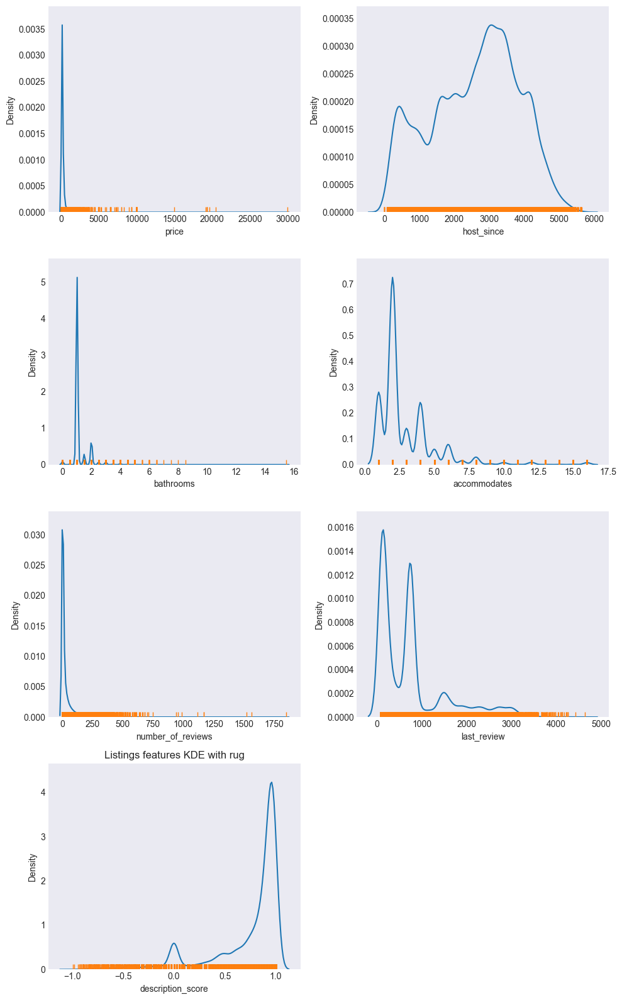

In [66]:
# Plot KDE with rug chart
kde_rug_plot(df_listings_ml.iloc[:, 1:], "Listings features KDE with rug")

> As we could see, data in all columns except host_since are very skewed. So, we perform RobustScaling.

> After the RobustScaling we will perform the MinMax scaling to feed the machine learning models.

> As for our target values - listings prices, we will utilize the Interquartile Range (or IQR) approach to detect and remove dutliers.

IQR is:  144.0
Lower limit -140.0
Upper limit 436.0


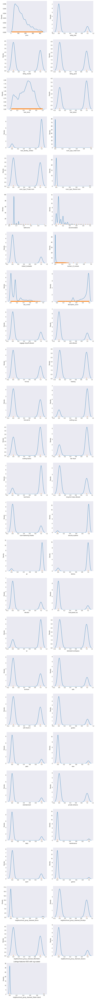

In [67]:
# Perform Robust scaling
robust_scaler = RobustScaler()
columns_to_scale = [
    "bathrooms",
    "accommodates",
    "number_of_reviews",
    "last_review",
]
for i in columns_to_scale:
    df_listings_ml[i] = robust_scaler.fit_transform(df_listings_ml[[i]])

# Initialize MinMaxScaler
minmax_scaler = MinMaxScaler()

# Numeric dtypes list
num_dtypes = ["int16", "int32", "int64", "float16", "float32", "float64"]

# List of numeric columns
numeric_columns = []

# Perform minmax scaling for numeric columns and convert bool to int
for column in df_listings_ml.iloc[:, 2:]:
    if df_listings_ml[column].dtype.name in num_dtypes:
        df_listings_ml[column] = minmax_scaler.fit_transform(df_listings_ml[[column]])
        numeric_columns.append(column)
    if df_listings_ml[column].dtype.name == "bool":
        df_listings_ml[column] = df_listings_ml[column].astype(float)

# Removing the outliers for price column with IQR approach
df_listings_ml.drop(index=iqr(df_listings_ml["price"]), inplace=True, errors="ignore")

# Plot the graph
kde_rug_plot(df_listings_ml.iloc[:, 1:], "Listings features KDE with rug scaled")

> To transform comments, we will use the TF-IDF method.

> The term TF refers to the frequency of a words' appearance, which is calculated by dividing the total number of words in the document by the frequency of its appearance. The term IDF refers to the inverse document frequency, which is calculated by counting the number of documents that contain the word 'w.' The weight of rare words is determined by it. The term TF-IDF is a combination of Term Frequency and Inverse Document Frequency.

In [68]:
# Data transformation
label_encoder = LabelEncoder()
tfid = TfidfVectorizer(tokenizer=identity, preprocessor=None, lowercase=False)
X_sentiment_tfid = tfid.fit_transform(df_reviews_agg["comments_tokens"])
y_sentiment_tfid = label_encoder.fit_transform(df_reviews_agg["rating"])

# Print encoded classes
print("Encoded classes: ", label_encoder.classes_)

Encoded classes:  ['bad' 'good' 'neutral']


In [69]:
# Uncomment lines to save data to disk
df_listings_ml.to_pickle(os.path.join(path_df, "listings_ml_scaling.pkl"))
sparse.save_npz(os.path.join(path_df, "X_sentiment_tfid.npz"), X_sentiment_tfid)
np.save(os.path.join(path_df, "y_sentiment_tfid.npy"), y_sentiment_tfid)

# Uncomment lines to load data from disk
# df_listings_ml = pd.read_pickle(os.path.join(path_df, "listings_ml_feature.pkl"))
# X_sentiment_tfid = sparse.load_npz(os.path.join(path_df, "X_sentiment_tfid.npz"))
# y_sentiment_tfid = np.load(os.path.join(path_df, "y_sentiment_tfid.npy"))

# Sentiment Analysis

## Classical ML Classification Models

> As demonstrated by the above section, we used pre-built models to predict sentiment scores as continuous variables (aka regression task). Currently, we shall construct classical ML models to predict sentiments as categorical variables, commonly referred to as classification tasks.

> We will utilise the following algorithms:

> - Decision Tree, which is a non-parametric supervised learning algorithm. It has a hierarchical, tree structure, which consists of a root node, branches, internal nodes and leaf nodes.
> 
> - Support Vector Machines(SVM), which is a supervised machine learning algorithm It is a boundary that best separates two classes (hyperplane/line).
> 
> - Stochastic Gradient Descent (SGD), which is an iterative method for optimizing an objective function with suitable smoothness properties.
> 
> - Naïve Bayes, which is a "probabilistic classifiers" based on applying Bayes' theorem. We will use Complement Naive Bayes and Multinomial Naive Bayes models.
> 
> - XGBoost, which implements machine learning algorithms under the Gradient Boosting framework (perform tree boosting in parallel).

> All algorithms will use the RandomizedSearchCV class with the accuracy scoring as the best estimator.

### Divide Data into Training and Validation Sets

> Further we will divide the dataset into training and validation sets for classification tasks.

In [70]:
# Divide dataset
(
    X_train_sentiment_tfid,
    X_test_sentiment_tfid,
    y_train_sentiment_tfid,
    y_test_sentiment_tfid,
) = train_test_split(
    X_sentiment_tfid,
    y_sentiment_tfid,
    test_size=0.2,
    random_state=42,
    shuffle=True,
    stratify=y_sentiment_tfid,
)

# Dictionary with evaluation metrics for different algorithms
model_comp = {}

### Balance the Sample with the SMOTE

> As we saw before, the data is not balanced. The imbalanced classification poses a challenge because there are not enough examples of the minority class to enable a model to comprehend the decision boundary.

> The most common way to create new examples is called the Synthetic Minority Oversampling TEchnique, or SMOTE. It works by selecting examples that are close to each other in the feature space, drawing a line between the examples, and then drawing a new sample at a point along the line. Specifically, a random instance from the minority group is selected as the initial selection. Then k of the closest neighbors for that example are found (usually k=5). A neighbor is randomly selected, and a synthetic example is generated at a randomly selected point in feature space between the two examples.

In [71]:
# Set and apply SMOTE for classification
X_sm_sentiment_tfid, y_sm_sentiment_tfid = SMOTE(
    sampling_strategy="all", random_state=42, n_jobs=4
).fit_resample(X_train_sentiment_tfid, y_train_sentiment_tfid)
print("Original dataset for classification shape %s" % Counter(y_sentiment_tfid))
print("Resampled dataset for classification shape %s" % Counter(y_sm_sentiment_tfid))

Original dataset for classification shape Counter({1: 15620, 0: 6465, 2: 5755})
Resampled dataset for classification shape Counter({2: 12496, 0: 12496, 1: 12496})


> We can observe that the data is distributed uniformly across classes. Let's save the data to disk.

In [72]:
# Uncomment lines to save data to disk
sparse.save_npz(os.path.join(path_df, "X_sm_sentiment_tfid.npz"), X_sm_sentiment_tfid)
np.save(os.path.join(path_df, "y_sm_sentiment_tfid.npy"), y_sm_sentiment_tfid)

# Uncomment lines to load data from disk
# X_sm_sentiment_tfid = sparse.load_npz(os.path.join(path_df, "X_sm_sentiment_tfid.npz"))
# y_sm_sentiment_tfid = np.load(os.path.join(path_df, "y_sm_sentiment_tfid.npy"))

### Stochastic Gradient Descent Algorithm

Classification Report:

              precision    recall  f1-score   support

         bad       0.62      0.71      0.66      1293
        good       0.80      0.77      0.79      3124
     neutral       0.48      0.45      0.46      1151

    accuracy                           0.69      5568
   macro avg       0.63      0.64      0.64      5568
weighted avg       0.69      0.69      0.69      5568

Confusion matrix:



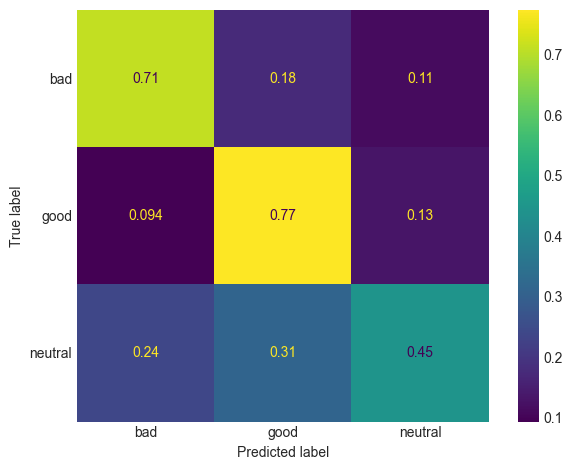

In [73]:
# SGD Classifier parameters
sgd_param = {
    "loss": ["modified_huber", "log", "hinge"],
    "penalty": ["l1", "elasticnet"],
    "alpha": [0.0001, 0.001, 0.01],
    "max_iter": [1000],
    "learning_rate": ["constant", "optimal", "adaptive"],
    "eta0": [1, 10],
    "early_stopping": [True],
}

# Initialize RandomizedSearchCV for SGDClassifier
scv_sgd = RandomizedSearchCV(
    estimator=SGDClassifier(),
    random_state=42,
    param_distributions=sgd_param,
    cv=5,
    scoring="accuracy",
    n_jobs=4,
)

# If model fitted, load saved model. Else, fit the model
if os.path.isfile(os.path.join(path_models, type(scv_sgd.estimator).__name__)):
    sgd_model = load_model(type(scv_sgd.estimator).__name__)

else:

    # Fit the model
    scv_sgd.fit(X_sm_sentiment_tfid, y_sm_sentiment_tfid)

    # compute performance on test set
    sgd_model = scv_sgd.best_estimator_

# Print classification report and confusion matrix
metrics(sgd_model)

### Decision Tree Algorithm

Classification Report:

              precision    recall  f1-score   support

         bad       0.42      0.25      0.32      1293
        good       0.62      0.81      0.70      3124
     neutral       0.34      0.19      0.25      1151

    accuracy                           0.56      5568
   macro avg       0.46      0.42      0.42      5568
weighted avg       0.51      0.56      0.52      5568

Confusion matrix:



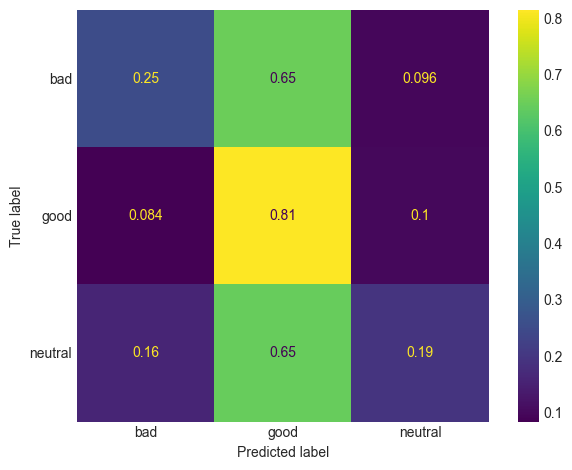

In [74]:
# Decision Tree Classifier parameters
dtc_param = {
    "splitter": ["best"],
    "criterion": ["gini", "entropy"],
    "max_features": ["log2", "sqrt", "auto"],
    "max_depth": [2, 5, 10],
    "min_samples_split": [2, 5, 9],
    "min_samples_leaf": [1, 5, 8],
}

# Initialize RandomizedSearchCV for DecisionTreeClassifier
scv_dtc = RandomizedSearchCV(
    estimator=DecisionTreeClassifier(),
    random_state=42,
    param_distributions=dtc_param,
    cv=5,
    scoring="accuracy",
    n_jobs=4,
)

# If model fitted, load saved model. Else, fit the model
if os.path.isfile(os.path.join(path_models, type(scv_dtc.estimator).__name__)):
    dtc_model = load_model(type(scv_dtc.estimator).__name__)

else:

    # Fit the model
    scv_dtc.fit(X_sm_sentiment_tfid, y_sm_sentiment_tfid)

    # compute performance on test set
    dtc_model = scv_dtc.best_estimator_

# Print classification report and confusion matrix
metrics(dtc_model)

### Complement Naive Bayes Algorithm

Classification Report:

              precision    recall  f1-score   support

         bad       0.54      0.68      0.61      1293
        good       0.75      0.77      0.76      3124
     neutral       0.29      0.19      0.23      1151

    accuracy                           0.63      5568
   macro avg       0.53      0.55      0.53      5568
weighted avg       0.61      0.63      0.61      5568

Confusion matrix:



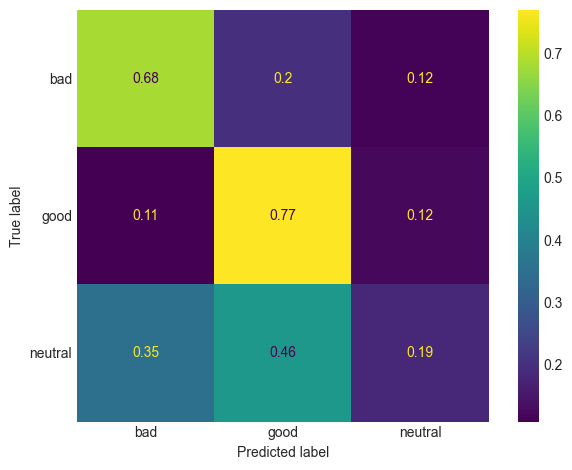

In [75]:
# Complement Naive Bayes Classifier parameters
cnb_param = {"alpha": [0.001, 0.1, 0.5, 1, 5, 10], "force_alpha": [False]}

# Initialize RandomizedSearchCV for ComplementNB
scv_cnb = RandomizedSearchCV(
    estimator=ComplementNB(),
    random_state=42,
    param_distributions=cnb_param,
    cv=5,
    scoring="accuracy",
    n_jobs=4,
)

# If model fitted, load saved model. Else, fit the model
if os.path.isfile(os.path.join(path_models, type(scv_cnb.estimator).__name__)):
    cnb_model = load_model(type(scv_cnb.estimator).__name__)

else:

    # Fit the model
    scv_cnb.fit(X_sm_sentiment_tfid, y_sm_sentiment_tfid)

    # compute performance on test set
    cnb_model = scv_cnb.best_estimator_

# Print classification report and confusion matrix
metrics(cnb_model)

### Multinomial Naive Bayes Algorithm

Classification Report:

              precision    recall  f1-score   support

         bad       0.62      0.60      0.61      1293
        good       0.79      0.72      0.75      3124
     neutral       0.35      0.44      0.39      1151

    accuracy                           0.64      5568
   macro avg       0.59      0.59      0.59      5568
weighted avg       0.66      0.64      0.65      5568

Confusion matrix:



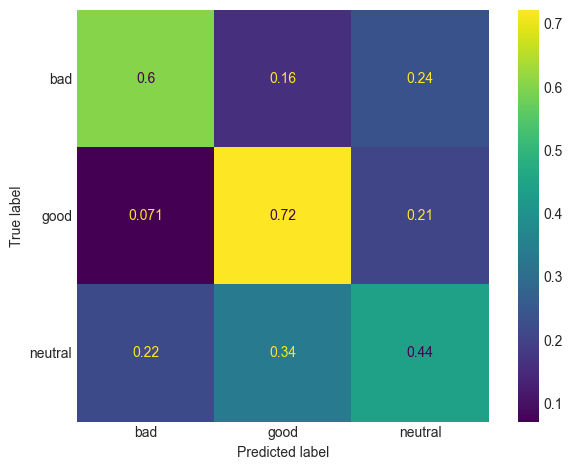

In [76]:
# Multinomial Naive Bayes Classifier parameters
mnb_param = {"alpha": [0.001, 0.1, 0.5, 1, 5, 10], "force_alpha": [False]}

# Initialize RandomizedSearchCV for MultinomialNB
scv_mnb = RandomizedSearchCV(
    estimator=MultinomialNB(),
    random_state=42,
    param_distributions=mnb_param,
    cv=5,
    scoring="accuracy",
    n_jobs=4,
)

# If model fitted, load saved model. Else, fit the model
if os.path.isfile(os.path.join(path_models, type(scv_mnb.estimator).__name__)):
    mnb_model = load_model(type(scv_mnb.estimator).__name__)

else:

    # Fit the model
    scv_mnb.fit(X_sm_sentiment_tfid, y_sm_sentiment_tfid)

    # compute performance on test set
    mnb_model = scv_mnb.best_estimator_

# Print classification report and confusion matrix
metrics(mnb_model)

### Logistic Regression Algorithm

Classification Report:

              precision    recall  f1-score   support

         bad       0.60      0.67      0.63      1293
        good       0.79      0.76      0.78      3124
     neutral       0.45      0.44      0.44      1151

    accuracy                           0.67      5568
   macro avg       0.61      0.62      0.62      5568
weighted avg       0.68      0.67      0.67      5568

Confusion matrix:



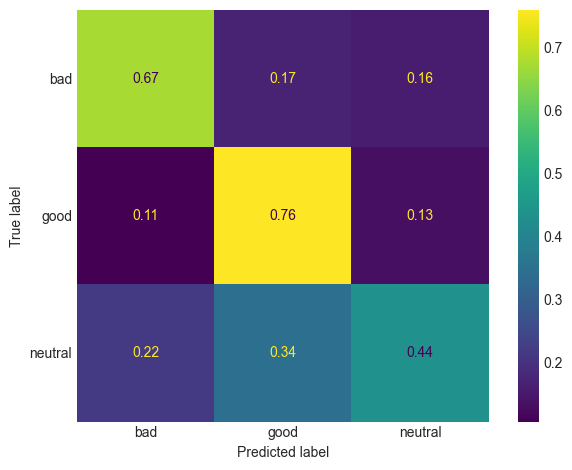

In [77]:
# Logistic Regression Classifier parameters
lr_param = {
    "C": [0.1, 1, 10],
    "penalty": ["l2"],
    "solver": ["saga", "lbfgs"],
    "max_iter": [1000],
}

# Initialize RandomizedSearchCV for LogisticRegression
scv_lr = RandomizedSearchCV(
    estimator=LogisticRegression(),
    random_state=42,
    param_distributions=lr_param,
    cv=5,
    scoring="accuracy",
    n_jobs=4,
)

# If model fitted, load saved model. Else, fit the model
if os.path.isfile(os.path.join(path_models, type(scv_lr.estimator).__name__)):
    lr_model = load_model(type(scv_lr.estimator).__name__)

else:

    # Fit the model
    scv_lr.fit(X_sm_sentiment_tfid, y_sm_sentiment_tfid)

    # compute performance on test set
    lr_model = scv_lr.best_estimator_

# Print classification report and confusion matrix
metrics(lr_model)

### XGBoost Algorithm

Classification Report:

              precision    recall  f1-score   support

         bad       0.62      0.34      0.44      1293
        good       0.65      0.87      0.74      3124
     neutral       0.38      0.22      0.28      1151

    accuracy                           0.61      5568
   macro avg       0.55      0.48      0.49      5568
weighted avg       0.59      0.61      0.58      5568

Confusion matrix:



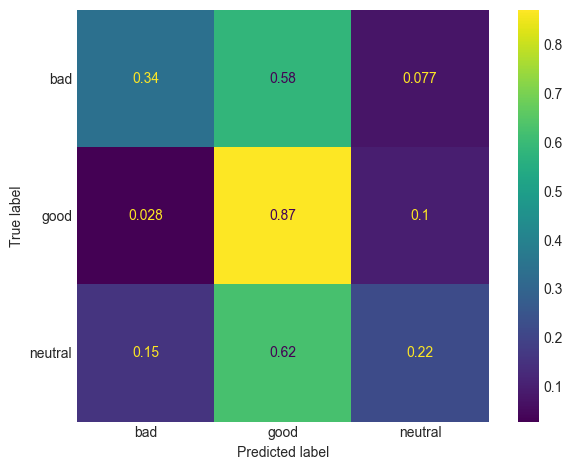

In [78]:
# XGBoost Classifier parameters
xgb_param = {
    "max_depth": [2],
    "learning_rate": [0.001, 0.1, 1],
    "n_estimators": [2],
    "enable_categorical": [True],
    "device": ["cuda"],
    "tree_method": ["hist", "approx"],
}

# Initialize RandomizedSearchCV for XGBoost
scv_xgb = RandomizedSearchCV(
    estimator=XGBClassifier(),
    random_state=42,
    param_distributions=xgb_param,
    cv=5,
    scoring="accuracy",
    n_jobs=4,
)

# If model fitted, load saved model. Else, fit the model
if os.path.isfile(os.path.join(path_models, type(scv_xgb.estimator).__name__)):
    xgb_model = load_model(type(scv_xgb.estimator).__name__)

else:

    # Fit the model
    scv_xgb.fit(X_sm_sentiment_tfid, y_sm_sentiment_tfid)

    # compute performance on test set
    xgb_model = scv_xgb.best_estimator_

# Print classification report and confusion matrix
metrics(xgb_model)

### Voting Classifier

> A voting classifier is a machine learning algorithm that learns from several ones and predicts an outcome (class) based on the highest likelihood of picking the chosen category.

> This algorithm amalgamates the outcomes of various classification algorithms and predicts the one that garners the most votes. The premise is that instead of constructing distinct models and ascertaining their precision, we devise a singular model that trains based on these models and derives predictions based on the aggregated majority of votes for each output class.

> We will use a method known as hard voting. This implies that the class that garners the most votes is the one that has the highest probability of being predicted by each of the classifiers.

Classification Report:

              precision    recall  f1-score   support

         bad       0.64      0.69      0.66      1293
        good       0.76      0.86      0.81      3124
     neutral       0.54      0.29      0.38      1151

    accuracy                           0.70      5568
   macro avg       0.64      0.61      0.62      5568
weighted avg       0.68      0.70      0.68      5568

Confusion matrix:



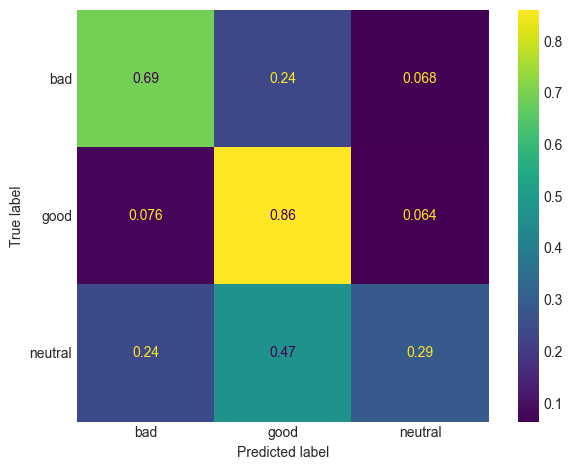

In [79]:
# Estimators for voting classifier
estimators = [
    ("StochasticGradientDescent", sgd_model),
    ("DecisionTree", dtc_model),
    ("ComplementNaiveBayes", cnb_model),
    ("MultinomialNaiveBayes", mnb_model),
    ("LogisticRegression", lr_model),
    ("XGBoost", xgb_model),
]

# Define Voting Classifier model
vc_model = VotingClassifier(estimators, voting="hard")

# If model fitted, load saved model. Else, fit the model
if os.path.isfile(os.path.join(path_models, type(vc_model).__name__)):
    vc_model = load_model(type(vc_model).__name__)

else:

    # Fit classifier
    vc_model.fit(X_sm_sentiment_tfid, y_sm_sentiment_tfid)

# Print classification report and confusion matrix
metrics(vc_model)

### Save Data

In [80]:
# Uncomment lines to save data to disk
try:
    file = open(os.path.join(path_models, "model_comp.pkl"), 'wb')
    pickle.dump(model_comp, file)
    file.close()
except:
    print("Something went wrong")

# Uncomment lines to load data from disk
# model_comp = pd.read_pickle(os.path.join(path_models, "model_comp.pkl"))

## Deep Learning Model

> Deep Learning is a very rapidly growing field, that is proving to be extremely beneficial in various scenarios. We will use the LSTM with CNN model.

> A Long Short-Term Memory, or LSTM, is a type of machine learning neural networks. More specifically, it belongs to the family of Recurrent Neural Networds (RNN) in Deep Learning, which are specifically conceived in order to process temporal data. Temporal data is defined as data that is highly influenced by the order that it is presented in. This means that data coming before or after a given datum (singular for data) can greatly affect this datum. Text data is an example of temporal data.

> A Convolutional Neural Networks, or CNN, tend to include multiple kernel heights, typically 3, each representing a different n-gram range. As a CNN trains, kernel weights are learned for words and surrounding words in a sequential window, yielding local features. CNNs then use max-pooling which aims to retain only the most important (highest value) local feature while discarding less important features.

### Split Dataset

> First of all, we will split the dataset for training and testing sets.

In [81]:
# Split dataset for deep learning model
(
    X_train_sentiment_dl,
    X_test_sentiment_dl,
    y_train_sentiment_dl,
    y_test_sentiment_dl,
) = train_test_split(
    df_reviews_agg["comments_clean"],
    df_reviews_agg["rating"],
    test_size=0.2,
    random_state=42,
    shuffle=True,
    stratify=df_reviews_agg["rating"],
)

### Data Pre-Processing

> It is expected that neural networks will receive numbers as inputs. Hence, it will be necessary to convert our textual data into numerical format.

> We will use the TextVectorization method to vectorize comments and then embed them.

> Word embeddings are a fundamental technique for converting words into representational vectors. Instead of assigning each word to an index, we assign it to a vector of genuine numbers, which represents the word. The goal is to make vectors that look similar to words that have the same meaning.

> For word embedding we will use the GloVe (or Global Vectors for Word Representation) model, created by the University of Stanford.

> GloVe vectors trained on 6 Billion tokens and having a dictionary, or vocabulary, size of 400,001 unique words.

> For rating labels, we will use the LabelEncoder method and then keras.to_categorical.

In [82]:
# Uncomment to load the pre-trained word embeddings
# !wget http://nlp.stanford.edu/data/glove.6B.zip
# !unzip -q glove.6B.zip

# Path to glove file
path_to_glove = os.path.join(path, "glove/glove.6B.300d.txt")

# Make vector representation of words
emb_idx = {}
with open(path_to_glove) as f:
    for line in f:
        word, ids = line.split(maxsplit=1)
        idx = np.fromstring(ids, "f", sep=" ")
        emb_idx[word] = idx
print("Found %s word vectors." % len(emb_idx))

Found 400000 word vectors.


In [83]:
# TextVectorization layer
vectorize_layer = layers.TextVectorization(
    max_tokens=50000,
    split="whitespace",
    standardize="lower_and_strip_punctuation",
    output_sequence_length=7000,
)

# Create the vocabulary
vectorize_layer.adapt(tf.data.Dataset.from_tensor_slices(X_train_sentiment_dl))
word_index = dict(
    zip(vectorize_layer.get_vocabulary(), range(vectorize_layer.vocabulary_size()))
)

# Prepare embedding matrix
num_tokens = vectorize_layer.vocabulary_size() + 2
dimension = 300
converted_words = 0
missed_words = 0
matrix = np.zeros((num_tokens, dimension))
for word, i in word_index.items():
    vector = emb_idx.get(word)
    if vector is not None:
        matrix[i] = vector
        converted_words += 1
    else:
        missed_words += 1
print("Converted %d words, missed %d words" % (converted_words, missed_words))

# Embedding layer
embedding_layer = layers.Embedding(
    num_tokens,
    dimension,
    embeddings_initializer=tf.keras.initializers.Constant(matrix),
    trainable=False,
)

Converted 21924 words, missed 9016 words


In [84]:
# Convert X train and test to vectors
X_train_sentiment_dl = to_vec(X_train_sentiment_dl)
X_test_sentiment_dl = to_vec(X_test_sentiment_dl)

# Convert y train to categorical
y_train_sentiment_dl = tf.keras.utils.to_categorical(
    label_encoder.fit_transform(y_train_sentiment_dl), num_classes=3
)

### Build the Model

In [85]:
# If the model exists on the disk, load the model and history
if os.path.isfile(os.path.join(path_models, "model_ml.h5")):

    model_dl = keras.models.load_model(os.path.join(path_models, "model_ml.h5"))
    history = pickle.load(history, open(os.path.join(path_models, "dl_history"), "rb"))

else:

    # Build the LSTM+CNN model
    int_sequences_input = tf.keras.Input(shape=(None,), dtype="int64")
    embedded_sequences = embedding_layer(int_sequences_input)
    x = layers.Conv1D(
        128, kernel_size=4, input_shape=(num_tokens, dimension), activation="relu"
    )(embedded_sequences)
    x = layers.MaxPooling1D(pool_size=32)(x)
    x = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)
    x = layers.LSTM(32, recurrent_dropout=0.4)(x)
    x = layers.Dropout(0.2)(x)
    preds = layers.Dense(len(label_encoder.classes_), activation="softmax")(x)
    model_dl = tf.keras.Model(int_sequences_input, preds, name="LSTM_CNN")
    model_dl.summary()
    model_dl.compile(
        loss="categorical_crossentropy",
        optimizer="adam",
        metrics=["categorical_accuracy"],
    )

    # Fit the model
    earlyStopCallBack = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=3)
    history = model_dl.fit(
        X_train_sentiment_dl,
        y_train_sentiment_dl,
        batch_size=32,
        epochs=20,
        validation_split=0.2,
        shuffle=True,
        callbacks=[earlyStopCallBack],
        # steps_per_epoch=5,
        workers=6,
        use_multiprocessing=True,
    )

    # Save the model
    model_dl.save(os.path.join(path_models, "model_ml.h5"))
    pickle.dump(history, open(os.path.join(path_models, "dl_history"), "wb"))

Model: "LSTM_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       (None, None, 300)         9282600   
                                                                 
 conv1d (Conv1D)             (None, None, 128)         153728    
                                                                 
 max_pooling1d (MaxPooling1  (None, None, 128)         0         
 D)                                                              
                                                                 
 bidirectional (Bidirection  (None, None, 128)         98816     
 al)                                                             
                                                                 
 lstm_1 (LSTM)               (None, 32)                206

### Model Evaluation

174/174 [==============================] - 48s 276ms/step
Classification Report:

              precision    recall  f1-score   support

         bad       0.67      0.59      0.63      1293
        good       0.78      0.79      0.79      3124
     neutral       0.43      0.47      0.45      1151

    accuracy                           0.68      5568
   macro avg       0.63      0.62      0.62      5568
weighted avg       0.68      0.68      0.68      5568

Confusion matrix:



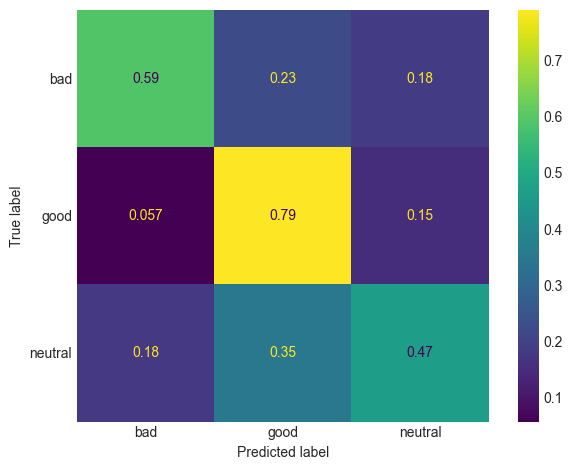

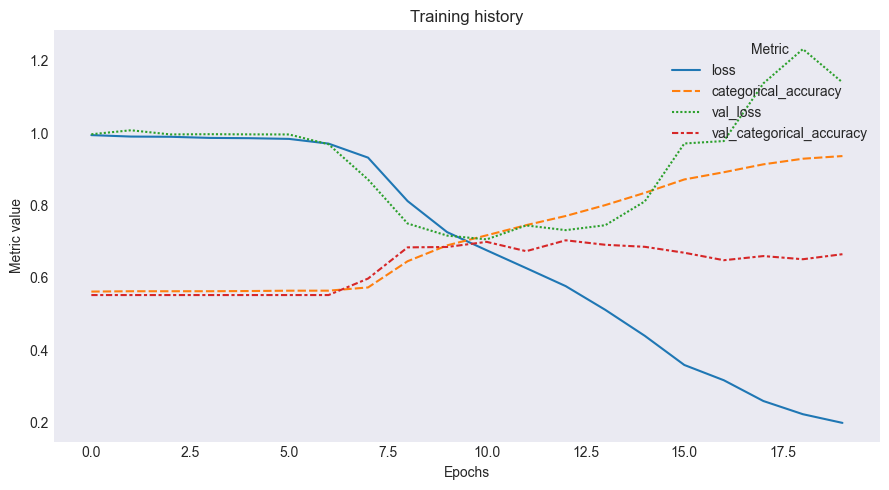

In [100]:
# Predict labels probabilities
prob = model_dl.predict(X_test_sentiment_dl)

# Translate probabilities to classes
y_pred_sentiment_dl = [
    label_encoder.classes_[np.argmax(prob[i])] for i in range(prob.shape[0])
]

# Print classification report
print("Classification Report:\n")
print(
    classification_report(
        y_test_sentiment_dl, y_pred_sentiment_dl, target_names=label_encoder.classes_
    )
)

# Print confusion matrix
print("Confusion matrix:\n")
fig, ax = plt.subplots()
cmd = ConfusionMatrixDisplay.from_predictions(
    y_test_sentiment_dl,
    y_pred_sentiment_dl,
    normalize="true",
    display_labels=label_encoder.classes_,
    ax=ax,
)
ax.grid(False)

# Save confusion matrix
save_figure(fig, "LSTM_CNN confusion matrix")

plt.show()

# Plot the history
fig, ax = plt.subplots(figsize=(9, 5))
sns.lineplot(data=pd.DataFrame.from_dict(history.history))
ax.set_xlabel("Epochs")
ax.set_ylabel("Metric value")
ax.set_title("Training history")
plt.legend(title="Metric", loc="upper right")

# Save figure
save_figure(fig, "LSTM + CNN model training history")

plt.show()

# Save evaluation metrics to dict
model_comp[model_dl.name] = {
    "accuracy": accuracy_score(y_test_sentiment_dl, y_pred_sentiment_dl),
    "recall": recall_score(y_test_sentiment_dl, y_pred_sentiment_dl, average="macro"),
    "precision": precision_score(
        y_test_sentiment_dl, y_pred_sentiment_dl, average="macro"
    ),
    "f1": f1_score(y_test_sentiment_dl, y_pred_sentiment_dl, average="macro"),
}

## Evaluation of Machine Learning Algorithms for the Guests Comments Sentiment Prediction

> Currently, we shall evaluate the performance of machine learning algorithms.

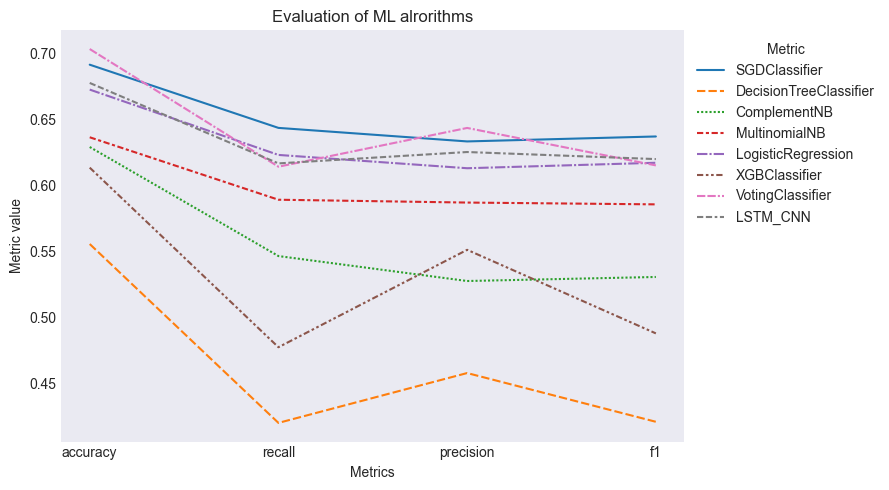

In [101]:
# Dataframe for metrics
df_metrics = pd.DataFrame(model_comp)

# Draw a chart
fig, ax = plt.subplots(figsize=(9, 5))
sns.lineplot(data=df_metrics)
ax.set_xlabel("Metrics")
ax.set_ylabel("Metric value")
ax.set_title("Evaluation of ML alrorithms")
plt.legend(title="Metric")
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

# Save figure
save_figure(fig, "Evaluation of sentiment prediction algorithms")

plt.show()

> It is evident that the Decision Tree Classifier and XGBClassifier exhibit the lowest performance. Deep Learning (Bi-LSTM with CNN) has a highest perfomance.
    
> Voting Classifier, Logistic Regression, and SGD Classifier show the same results. However, we should mention that SGDClassifier is a time efficient algorithm compared to others.

> The performance outcomes for other cases utilizing sentiment analysis, such as IMDB, Tweeter, Amazon, and others, are superior. I believe that this is due to the Airbnb rating system. Traditionally, the listing ratings are categorized into a range of 0 to 5. However, in reality, the majority (95%) of rating scores exceed 4.0. Therefore, it presents a significant challenge for classification systems to appropriately label the ratings.

In [102]:
# Show the evaluation metrics for sentiment prediction models
df_metrics_print = df_metrics.T.sort_values(by="f1", ascending=False)

# Round values
for column in df_metrics_print.columns:
    df_metrics_print[column] = round(df_metrics_print[column], 2)

# Export df to png
dfi.export(df_metrics_print, os.path.join(path_png, "classification_models_eval_table.png"))

# Show df
df_metrics_print

,accuracy,recall,precision,f1
SGDClassifier,0.69,0.64,0.63,0.64
LSTM_CNN,0.68,0.62,0.63,0.62
LogisticRegression,0.67,0.62,0.61,0.62
VotingClassifier,0.70,0.61,0.64,0.62
MultinomialNB,0.64,0.59,0.59,0.59
ComplementNB,0.63,0.55,0.53,0.53
XGBClassifier,0.61,0.48,0.55,0.49
DecisionTreeClassifier,0.56,0.42,0.46,0.42


# Listings Price Prediction

## Split Dataset

In [104]:
# Split dataset for listing price prediction models
(
    X_train_listings,
    X_test_listings,
    y_train_listings,
    y_test_listings,
) = train_test_split(
    df_listings_ml.iloc[:, 2:],
    df_listings_ml.iloc[:, 1],
    test_size=0.2,
    random_state=42,
    shuffle=True,
)

## Classical ML Regression Models

In [105]:
# Initialize dict for model comparision
model_comp_price = {}

# Define regression models
regressors = {
    "LinearRegression": LinearRegression(),
    "KNeighborsRegressor": KNeighborsRegressor(),
    "Ridge": Ridge(),
    "XGBRegressor": XGBRegressor(),
    "LassoCV": LassoCV(),
    "SVR": SVR(),
    "LinearSVR": LinearSVR(),
    "NuSVR": NuSVR(),
    "SGDRegressor": SGDRegressor(),
    "DecisionTreeRegressor": DecisionTreeRegressor(),
    "RandomForestRegressor": RandomForestRegressor(),
    "Lars": Lars(),
    "TheilSenRegressor": TheilSenRegressor(),
    "HuberRegressor": HuberRegressor(),
    "PassiveAggressiveRegressor": PassiveAggressiveRegressor(),
    "ARDRegression": ARDRegression(),
    "BayesianRidge": BayesianRidge(),
    "ElasticNet": ElasticNet(),
    "OrthogonalMatchingPursuit": OrthogonalMatchingPursuit(),
    "GradientBoostingRegressor": GradientBoostingRegressor(),
}

# Train models and predict target values
for key in regressors:
    print(key, " running ...")
    regressor = regressors[key]
    model = regressor.fit(X_train_listings, y_train_listings)
    model_comp_price = metrics_price(model, model_comp_price, "ml")

LinearRegression  running ...
KNeighborsRegressor  running ...
Ridge  running ...
XGBRegressor  running ...
LassoCV  running ...
SVR  running ...
LinearSVR  running ...
NuSVR  running ...
SGDRegressor  running ...
DecisionTreeRegressor  running ...
RandomForestRegressor  running ...
Lars  running ...
TheilSenRegressor  running ...
HuberRegressor  running ...
PassiveAggressiveRegressor  running ...
ARDRegression  running ...
BayesianRidge  running ...
ElasticNet  running ...
OrthogonalMatchingPursuit  running ...
GradientBoostingRegressor  running ...


## Deep Learning Models

### Three Layer Neural Network

In [106]:
# Check if model exists
if os.path.isfile(os.path.join(path_models, "Keras_model_1.h5")):

    # Load model
    model_dl_1 = keras.models.load_model(os.path.join(path_models, "Keras_model_1.h5"))
    model_comp_price = metrics_price(model_dl_1, model_comp_price, "dl").copy()

else:

    # Build the model
    int_sequences_input = tf.keras.Input(shape=(X_train_listings.shape[1],))
    x = layers.Dense(128, activation="relu")(int_sequences_input)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dense(256, activation="relu")(x)
    preds = layers.Dense(1, activation="linear")(x)
    model_dl_1 = tf.keras.Model(int_sequences_input, preds, name="Keras_model_1")
    model_dl_1.summary()
    model_dl_1.compile(
        loss="mean_squared_error",
        optimizer="adam",
        metrics=["mean_squared_error"],
    )

    # Fit the model
    earlyStopCallBack = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=3)
    history = model_dl_1.fit(
        X_train_listings,
        y_train_listings,
        batch_size=256,
        epochs=200,
        validation_split=0.2,
        shuffle=True,
        callbacks=[earlyStopCallBack],
        steps_per_epoch=100,
        workers=6,
        use_multiprocessing=True,
        verbose=0,
    )

    # Save the model
    model_comp_price = metrics_price(model_dl_1, model_comp_price, "dl").copy()

Model: "Keras_model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 50)]              0         
                                                                 
 dense_1 (Dense)             (None, 128)               6528      
                                                                 
 dense_2 (Dense)             (None, 256)               33024     
                                                                 
 dense_3 (Dense)             (None, 256)               65792     
                                                                 
 dense_4 (Dense)             (None, 1)                 257       
                                                                 
Total params: 105601 (412.50 KB)
Trainable params: 105601 (412.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
227/227 [====

### Four-Layer Neural Network with L1 Regularization

In [107]:
# Check if model exists
if os.path.isfile(os.path.join(path_models, "Keras_model_2.h5")):

    # Load model
    model_dl_2 = keras.models.load_model(os.path.join(path_models, "Keras_model_2.h5"))
    model_comp_price = metrics_price(model_dl_2, model_comp_price, "dl").copy()

else:

    # Build the model
    int_sequences_input = tf.keras.Input(shape=(X_train_listings.shape[1],))
    x = layers.Dense(128, kernel_regularizer=regularizers.l1(0.005), activation="relu")(
        int_sequences_input
    )
    x = layers.Dense(256, kernel_regularizer=regularizers.l1(0.005), activation="relu")(
        x
    )
    x = layers.Dense(256, kernel_regularizer=regularizers.l1(0.005), activation="relu")(
        x
    )
    x = layers.Dense(512, kernel_regularizer=regularizers.l1(0.005), activation="relu")(
        x
    )
    preds = layers.Dense(1, activation="linear")(x)
    model_dl_2 = tf.keras.Model(int_sequences_input, preds, name="Keras_model_2")
    model_dl_2.summary()
    model_dl_2.compile(
        loss="mean_squared_error",
        optimizer="adam",
        metrics=["mean_squared_error"],
    )

    # Fit the model
    earlyStopCallBack = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=3)
    history = model_dl_2.fit(
        X_train_listings,
        y_train_listings,
        batch_size=256,
        epochs=200,
        validation_split=0.2,
        shuffle=True,
        callbacks=[earlyStopCallBack],
        steps_per_epoch=100,
        workers=6,
        use_multiprocessing=True,
        verbose=0,
    )

    # Save the model
    model_comp_price = metrics_price(model_dl_2, model_comp_price, "dl").copy()

Model: "Keras_model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 50)]              0         
                                                                 
 dense_5 (Dense)             (None, 128)               6528      
                                                                 
 dense_6 (Dense)             (None, 256)               33024     
                                                                 
 dense_7 (Dense)             (None, 256)               65792     
                                                                 
 dense_8 (Dense)             (None, 512)               131584    
                                                                 
 dense_9 (Dense)             (None, 1)                 513       
                                                                 
Total params: 237441 (927.50 KB)
Trainable params: 23

### Four-Layer Neural Network with Dropout Regularization at 50%

In [108]:
# Check if model exists
if os.path.isfile(os.path.join(path_models, "Keras_model_3.h5")):

    # Load model
    model_dl_3 = keras.models.load_model(os.path.join(path_models, "Keras_model_3.h5"))
    model_comp_price = metrics_price(model_dl_3, model_comp_price, "dl").copy()

else:

    # Build the model
    int_sequences_input = tf.keras.Input(shape=(X_train_listings.shape[1],))
    x = layers.Dropout(0.5)(int_sequences_input)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(512, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    preds = layers.Dense(1, activation="linear")(x)
    model_dl_3 = tf.keras.Model(int_sequences_input, preds, name="Keras_model_3")
    model_dl_3.summary()
    model_dl_3.compile(
        loss="mean_squared_error",
        optimizer="adam",
        metrics=["mean_squared_error"],
    )

    # Fit the model
    earlyStopCallBack = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=3)
    history = model_dl_3.fit(
        X_train_listings,
        y_train_listings,
        batch_size=256,
        epochs=200,
        validation_split=0.2,
        shuffle=True,
        callbacks=[earlyStopCallBack],
        steps_per_epoch=100,
        workers=6,
        use_multiprocessing=True,
        verbose=0,
    )

    # Save the model
    model_comp_price = metrics_price(model_dl_3, model_comp_price, "dl").copy()

Model: "Keras_model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 50)]              0         
                                                                 
 dropout_1 (Dropout)         (None, 50)                0         
                                                                 
 dense_10 (Dense)            (None, 128)               6528      
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_11 (Dense)            (None, 256)               33024     
                                                                 
 dropout_3 (Dropout)         (None, 256)               0         
                                                                 
 dense_12 (Dense)            (None, 512)             

### Four-Layer Neural Network with Dropout and Regularization at 30%

In [109]:
# Check if model exists
if os.path.isfile(os.path.join(path_models, "Keras_model_4.h5")):

    # Load model
    model_dl_4 = keras.models.load_model(os.path.join(path_models, "Keras_model_4.h5"))
    model_comp_price = metrics_price(model_dl_4, model_comp_price, "dl").copy()

else:

    # Build the model
    int_sequences_input = tf.keras.Input(shape=(X_train_listings.shape[1],))
    x = layers.Dropout(0.2)(int_sequences_input)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(512, activation="relu")(x)
    x = layers.Dropout(0.2)(x)
    preds = layers.Dense(1, activation="linear")(x)
    model_dl_4 = tf.keras.Model(int_sequences_input, preds, name="Keras_model_4")
    model_dl_4.summary()
    model_dl_4.compile(
        loss="mean_squared_error",
        optimizer="adam",
        metrics=["mean_squared_error"],
    )

    # Fit the model
    earlyStopCallBack = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=3)
    history = model_dl_4.fit(
        X_train_listings,
        y_train_listings,
        batch_size=256,
        epochs=200,
        validation_split=0.2,
        shuffle=True,
        callbacks=[earlyStopCallBack],
        steps_per_epoch=100,
        workers=6,
        use_multiprocessing=True,
        verbose=0,
    )

    # Save the model
    model_comp_price = metrics_price(model_dl_4, model_comp_price, "dl").copy()

Model: "Keras_model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 50)]              0         
                                                                 
 dropout_5 (Dropout)         (None, 50)                0         
                                                                 
 dense_14 (Dense)            (None, 128)               6528      
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 dense_15 (Dense)            (None, 256)               33024     
                                                                 
 dropout_7 (Dropout)         (None, 256)               0         
                                                                 
 dense_16 (Dense)            (None, 512)             

## Evaluation of Machine Learning Algorithms for the Price Prediction

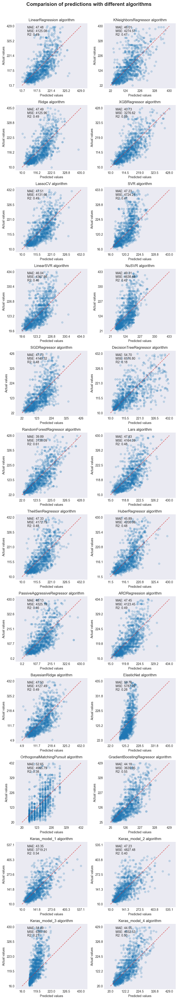

In [110]:
# Evaluation of Machine Learning Algorithms
models_eval_chart(model_comp_price, y_test_listings)

## Save Models Evaluation

In [111]:
# Uncomment lines to save data to disk
try:
    file = open(os.path.join(path_models, "model_comp_price.pkl"), "wb")
    pickle.dump(model_comp_price, file)
    file.close()
except:
    print("Something went wrong")

# Uncomment lines to load data from disk
# model_comp = pd.read_pickle(os.path.join(path_models, "model_comp_price.pkl"))

## Fine Tuning

> We will take the model with the highest scores (RandomForestRegressot) and fine tune it.

In [112]:
# Define parameters for GridSearchCV
parameters = {
    "max_depth": [None, 1, 3, 5, 10, 20],
    "n_estimators": [10, 20, 30, 100],
    "max_features": [1, 3, 5, 7, 10, 20, 30],
}

# Grid search
grid_search = GridSearchCV(
    estimator=RandomForestRegressor(),
    param_grid=parameters,
    scoring="neg_root_mean_squared_error",
    cv=10,
    n_jobs=6,
)

# If model fitted, load saved model. Else, fit the model
if os.path.isfile(os.path.join(path_models, "Fine_tuned_model")):
    best_model = load_model("Fine_tuned_model")

else:

    # Fit the model
    grid_search.fit(X_train_listings, y_train_listings)

    # Define the best estimators
    best_model = grid_search.best_estimator_

# Evaluate model
model_comp_price = metrics_price(best_model, model_comp_price, "Fine_tuned")

## Final Price Prediction Models Evaluation

> Let's finally compare price prediction regression models with fine tuned model.

In [113]:
# Convert dict to data frame
df_models_comp = pd.DataFrame.from_dict(model_comp_price, orient="index")

# Drop row with target value prediction
df_models_comp.drop("y_pred", axis=1, inplace=True, errors="ignore")

# Sort values by R2
df_models_comp.sort_values(by="R2", ascending=False, inplace=True)

# Round values
for column in df_models_comp.columns:
    df_models_comp[column] = round(df_models_comp[column], 2)

# Export to png
dfi.export(df_models_comp, os.path.join(path_png, "regression_models_eval_table.png"))

# Display df
df_models_comp

,MAE,MSE,R2
Fine_tuned,39.39,3051.90,0.62
RandomForestRegressor,39.89,3138.09,0.61
XGBRegressor,40.73,3276.62,0.59
GradientBoostingRegressor,44.18,3635.95,0.55
Keras_model_1,43.35,3719.21,0.54
Keras_model_4,44.55,4032.53,0.50
BayesianRidge,47.50,4127.49,0.49
ARDRegression,47.45,4123.45,0.49
LinearRegression,47.48,4125.08,0.49
LassoCV,47.51,4131.66,0.49


> We could observe that the RandomForestRegressor model had the highest prediction power with R2 equal to 0.61, MAE 39.89 and MSE 3138.09.

> The XGBRegressor model showed the R2 with 0.59, MAE 40.73 and MSE 3276.62.

> The GradientBoostingRegressor model had R2 0.55, MAE 44.18 and MSE 3635.95.

> The LinearRegression, Ridge, LassoCV, BayesianRidge, SGDRegressor, ARDRegression, HuberRegressor, TheilSenRegressor, Lars, and KNeighborsRegressor showed about the same results with R2 0.47-0.49, MAE 47.50-45.89, and MSE 4125.11-4276.28.

> The DecisionTreeRegressor algorithm showed the worst result with R2 0.18, MAE 54.70 and MSE 6576.80.

> With the RandomForestRegressor model fine-tuning we slightly improved the  accuracy with R2 equal to 0.62, MAE 39.39 and MSE 3061.90.

> The custom deep learning models showed the average results with R2 ranging from 0.21 to 0.54, MAE ranging from 54.49 to 43.35 and MSE ranging from 6357.90 to 3719.21.

## Feature Importance Analysis

> Finaly, let's perform the feature importance analysis. We will use the fine tuned RandomForestRegressor model.

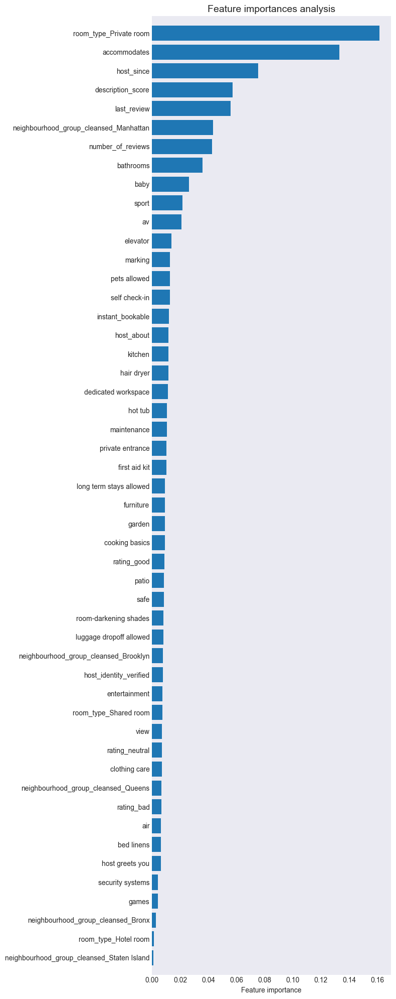

In [114]:
# Perform the feature importance analysis

# Feature weights
ft_weights = pd.DataFrame(
    best_model.feature_importances_, columns=["weight"], index=X_train_listings.columns
)
ft_weights.sort_values("weight", inplace=True)

# Plotting feature importances
fig = plt.figure(figsize=(8, 20))
plt.barh(ft_weights.index, ft_weights.weight, align="center")
plt.title("Feature importances analysis", fontsize=14)
plt.xlabel("Feature importance")
plt.margins(y=0.01)

# Save figure
save_figure(fig, "Feature importances analysis")

plt.show()

> As we can observe, the feature importance analysis showed that top-10 features are:
> 1. Room type with 15.3% weight.
> 2. Number of accommodates with 14.6% weight.
> 3. Host since with 6.9% weight.
> 4. Last review with 5.3 weight.
> 5. Description sentiment analysis with 5.1% weight.
> 6. The listing location is in Manhattan with 4.5% weight.
> 7. Number of reviews with 4.1% weight.
> 8. Baby amenities with 3.8% weight.
> 9. Number of bathrooms with 3.7% weight.
> 10. Sport amenities with 2.7% weight.